<b><p style="text-align: center;">Описание проекта</p></b>

Используя данные пациентов, такие как возраст, привычки, состояние здоровья и результаты анализа крови разработать модель для предсказания риска сердечного приступа <br> 

<b><p style="text-align: center;">Цель проекта</p></b>
- **Задача 1: разработать модель машинного обучения;**
- **Задача 2: разработать интерфейс, приложение на FastAPI к модели МО для предсказания на тестовой выборке**


<b><p style="text-align: center;">Краткий план</p></b>
1. Загрузка данных<br>
2 датасета: <br>
- heart_train.csv - данные пациентов для предсказания риска сердечных приступов: id,антропометрические параметры (вес, возраст, рост), привычки (курение, качество сна и т.д), давление, наличие хронических заболеваний, биохимия крови, таргет - высокий или низкий риск поражения сердца; <br>
- test.csv - тестовая выборка. <br>

2. Предобработка данных<br>
- изучить пропуски, произвести замену при необходимости;<br>
- изучить дубликаты, произвести замену/удаление при необходимости;<br>
- проверить типы данных, произвести замену при необходимости;<br>

3. Исследовательский анализ данных <br>
- проанализировать признаки, составить общее представление зависимостей признаков от таргет-признака; <br>

4. Задача 1: Разработать и обучить модель МО<br>
- определить наилучшую метрику оценки качества модели и обосновать выбор<br>

5. Задача 2: разработать интерфейс, приложение на FastAPI к модели МО для предсказания на тестовой выборке<br>
- подготовка скрипта и библиотеки для обработки данных и предсказания на тестовой выборке<br>

6. **Итоговые выводы**

# Импорт библиотек

In [1]:
# устанавливаем shap
!pip install shap 

#обновляем библиотеку scikit-learn
!pip install -Uq scikit-learn

#устанваливаем нужную версию, чтобы не вызывало проблем в окружении
!pip install matplotlib

#!pip install "numpy<2.2" --force-reinstall
#!pip uninstall scipy -y
#!pip install scipy==1.10.1

#устанваливаем phik
!pip install phik

#устанваливаем missingno
!pip install missingno

In [2]:
# загрузка стандартных библиотек
import copy
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import seaborn as sns

# импортируем missingno и патчи для графиков
import missingno as msno
import matplotlib.patches as mpatches

# импортируем модули статистики
from scipy import stats as st
# импортируем коэффициент Спирмана
from scipy.stats import spearmanr

# импортируем коэффициент phik
from phik import report
from phik.report import plot_correlation_matrix

# импортируем функцию для разделения датасета на выборки
from sklearn.model_selection import train_test_split

# импортируем инструмент пайплайнов
from sklearn.pipeline import Pipeline

# импортируем класс ColumnTransformer помогает работать с данными разного типа в одном наборе
from sklearn.compose import ColumnTransformer

# импортируем инструмент для автоподбора гиперпараметров RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

# импортируем градиентныый бустинг
from xgboost import XGBClassifier

# импортируем метрики
import scipy.stats as st
from sklearn.metrics import (
        make_scorer, 
        f1_score, 
        roc_auc_score, 
        recall_score, 
        precision_score, 
        accuracy_score, 
        confusion_matrix,
        fbeta_score,
        classification_report,
        precision_recall_curve,
        precision_recall_fscore_support
)

# импортируйте функции для графика ROC-кривой
from sklearn.metrics import RocCurveDisplay

# импортируем модель дерева решений
from sklearn.tree import DecisionTreeClassifier

# импортируем модель к ближайших соседей
from sklearn.neighbors import KNeighborsClassifier

# импортируем модель SVC
from sklearn.svm import SVC

# импортируем  метод SHAP
import shap

import joblib
from pathlib import Path


# 1. Загрузка данных

### 1.1 загрузка тренирвочной выборки

In [3]:
# загрузка Тренировочной выборки:
pth_heart_train = './datasets/heart_train.csv'
if os.path.exists(pth_heart_train):
    heart_train = pd.read_csv(pth_heart_train)
#elif os.path.exists(указать другой путь):
#    market_file = pd.read_csv(указать другой путь)
else:
    print('Ошибка пути считывания датасета')
# вывод 5 строк датасета
heart_train.head(5)

,Unnamed: 0,Age,Cholesterol,Heart rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,...,Physical Activity Days Per Week,Sleep Hours Per Day,Heart Attack Risk (Binary),Blood sugar,CK-MB,Troponin,Gender,Systolic blood pressure,Diastolic blood pressure,id
0,0,0.359551,0.732143,0.074244,1.0,1.0,1.0,1.0,1.0,0.535505,...,3.0,0.333333,0.0,0.227018,0.048229,0.036512,Male,0.212903,0.709302,2664
1,1,0.202247,0.325000,0.047663,1.0,1.0,0.0,0.0,1.0,0.068690,...,3.0,0.833333,0.0,0.150198,0.017616,0.000194,Female,0.412903,0.569767,9287
2,2,0.606742,0.860714,0.055912,1.0,0.0,1.0,1.0,1.0,0.944001,...,2.0,1.000000,0.0,0.227018,0.048229,0.036512,Female,0.238710,0.220930,5379
3,3,0.730337,0.007143,0.053162,0.0,0.0,1.0,0.0,1.0,0.697023,...,0.0,0.333333,1.0,0.227018,0.048229,0.036512,Female,0.348387,0.267442,8222
4,4,0.775281,0.757143,0.021998,0.0,0.0,1.0,0.0,1.0,0.412878,...,5.0,1.000000,1.0,0.227018,0.048229,0.036512,Male,0.619355,0.441860,4047


In [4]:
# выведем название столбцов
heart_train.columns

Index(['Unnamed: 0', 'Age', 'Cholesterol', 'Heart rate', 'Diabetes',
       'Family History', 'Smoking', 'Obesity', 'Alcohol Consumption',
       'Exercise Hours Per Week', 'Diet', 'Previous Heart Problems',
       'Medication Use', 'Stress Level', 'Sedentary Hours Per Day', 'Income',
       'BMI', 'Triglycerides', 'Physical Activity Days Per Week',
       'Sleep Hours Per Day', 'Heart Attack Risk (Binary)', 'Blood sugar',
       'CK-MB', 'Troponin', 'Gender', 'Systolic blood pressure',
       'Diastolic blood pressure', 'id'],
      dtype='object')

In [5]:
#выведем размерность датасета
heart_train.shape

(8685, 28)

In [6]:
#создадим глубокую копию датасета, чтобы ее редактировать, чтобы исходный остался в исходном виде
heart_train_ru = copy.deepcopy(heart_train)

In [7]:
#переименуем имена столбцов
new_name_columns = ['порядковый номер', 'Возраст', 'Холестерин', 'Частота сердечных сокращений', 'Диабет', 'Семейный анамнез', 'Курение', 'Ожирение', 'Употребление алкоголя', 'Часы упражнений в неделю', 'Диета', 'Предыдущие проблемы с сердцем', 'Прием лекарств', 'Уровень стресса', 'Часы сидячего образа жизни в день', 'Доход', 'ИМТ', 'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день', 'Риск сердечного приступа (бинарный)', 'Сахар в крови', 'CK-MB (показатель поврежд. миокарда)', 'Тропонин (поврежден. серд. мышцы)', 'Пол', 'Систолическое артериальное давление', 'Диастолическое артериальное давление', 'id']
heart_train_ru.columns = new_name_columns
heart_train_ru.head(5)

,порядковый номер,Возраст,Холестерин,Частота сердечных сокращений,Диабет,Семейный анамнез,Курение,Ожирение,Употребление алкоголя,Часы упражнений в неделю,...,Дни физической активности в неделю,Часы сна в день,Риск сердечного приступа (бинарный),Сахар в крови,CK-MB (показатель поврежд. миокарда),Тропонин (поврежден. серд. мышцы),Пол,Систолическое артериальное давление,Диастолическое артериальное давление,id
0,0,0.359551,0.732143,0.074244,1.0,1.0,1.0,1.0,1.0,0.535505,...,3.0,0.333333,0.0,0.227018,0.048229,0.036512,Male,0.212903,0.709302,2664
1,1,0.202247,0.325000,0.047663,1.0,1.0,0.0,0.0,1.0,0.068690,...,3.0,0.833333,0.0,0.150198,0.017616,0.000194,Female,0.412903,0.569767,9287
2,2,0.606742,0.860714,0.055912,1.0,0.0,1.0,1.0,1.0,0.944001,...,2.0,1.000000,0.0,0.227018,0.048229,0.036512,Female,0.238710,0.220930,5379
3,3,0.730337,0.007143,0.053162,0.0,0.0,1.0,0.0,1.0,0.697023,...,0.0,0.333333,1.0,0.227018,0.048229,0.036512,Female,0.348387,0.267442,8222
4,4,0.775281,0.757143,0.021998,0.0,0.0,1.0,0.0,1.0,0.412878,...,5.0,1.000000,1.0,0.227018,0.048229,0.036512,Male,0.619355,0.441860,4047


In [8]:
heart_train_ru.columns

Index(['порядковый номер', 'Возраст', 'Холестерин',
       'Частота сердечных сокращений', 'Диабет', 'Семейный анамнез', 'Курение',
       'Ожирение', 'Употребление алкоголя', 'Часы упражнений в неделю',
       'Диета', 'Предыдущие проблемы с сердцем', 'Прием лекарств',
       'Уровень стресса', 'Часы сидячего образа жизни в день', 'Доход', 'ИМТ',
       'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день',
       'Риск сердечного приступа (бинарный)', 'Сахар в крови',
       'CK-MB (показатель поврежд. миокарда)',
       'Тропонин (поврежден. серд. мышцы)', 'Пол',
       'Систолическое артериальное давление',
       'Диастолическое артериальное давление', 'id'],
      dtype='object')

In [9]:
#выведем размерность датасета
heart_train_ru.shape

(8685, 28)

- **загрузка датасета тренировочной выборки прошла успешно, столбцы переименованы на русский язык**

### 1.2 загрузка тестовой выборки

In [10]:
# загрузка тестовой выборки:
pth_heart_test = './datasets/heart_test.csv'
if os.path.exists(pth_heart_test):
    heart_test = pd.read_csv(pth_heart_test)
#elif os.path.exists(указать другой путь):
#    market_file = pd.read_csv(указать другой путь)
else:
    print('Ошибка пути считывания датасета')
# вывод 5 строк датасета
heart_test.head(5)

,Unnamed: 0,Age,Cholesterol,Heart rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,...,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Blood sugar,CK-MB,Troponin,Gender,Systolic blood pressure,Diastolic blood pressure,id
0,0,0.494382,0.264286,0.062328,0.0,1.0,1.0,1.0,1.0,0.361618,...,0.306494,1.0,0.333333,0.227018,0.048229,0.036512,Male,0.283871,0.372093,7746
1,1,0.224719,0.953571,0.082493,1.0,0.0,0.0,1.0,0.0,0.996483,...,0.087013,0.0,0.166667,0.227018,0.048229,0.036512,Female,0.703226,0.441860,4202
2,2,0.629213,0.092857,0.064161,0.0,1.0,1.0,1.0,0.0,0.995561,...,0.205195,7.0,1.000000,0.102767,0.002666,0.088455,Male,0.458065,0.779070,6632
3,3,0.460674,0.567857,0.055912,1.0,1.0,1.0,1.0,1.0,0.437277,...,0.163636,0.0,0.666667,0.203557,0.056390,0.271774,Female,0.741935,0.255814,4639
4,4,0.719101,0.485714,0.022915,1.0,0.0,1.0,0.0,1.0,0.514920,...,0.580519,5.0,0.000000,0.227018,0.048229,0.036512,Male,0.412903,0.395349,4825


In [11]:
heart_test.columns

Index(['Unnamed: 0', 'Age', 'Cholesterol', 'Heart rate', 'Diabetes',
       'Family History', 'Smoking', 'Obesity', 'Alcohol Consumption',
       'Exercise Hours Per Week', 'Diet', 'Previous Heart Problems',
       'Medication Use', 'Stress Level', 'Sedentary Hours Per Day', 'Income',
       'BMI', 'Triglycerides', 'Physical Activity Days Per Week',
       'Sleep Hours Per Day', 'Blood sugar', 'CK-MB', 'Troponin', 'Gender',
       'Systolic blood pressure', 'Diastolic blood pressure', 'id'],
      dtype='object')

In [12]:
#выведем размерность датасета
heart_test.shape

(966, 27)

- **отмечаем, что тестовая выборка на одну колонку меньше тренировочной**
- **найдем пропущенную столбец тестовой выборки:**

In [13]:
for i in heart_train.columns:
    if i in heart_test.columns:
        print('Столбец с названием', i, "тренирвочной выборки присуствует в тестовой выборке")
    else: print('Столбец с названием', i, "тренирвочной выборки ОТСУСТВУЕТ в тестовой выборке")

Столбец с названием Unnamed: 0 тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Age тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Cholesterol тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Heart rate тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Diabetes тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Family History тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Smoking тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Obesity тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Alcohol Consumption тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Exercise Hours Per Week тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Diet тренирвочной выборки присуствует в тестовой выборке
Столбец с названием Previous Heart Problems тренирвочной выборки присуствует в те

- **Отсуствует Heart Attack Risk (Binary) - целевой признак, по ТЗ сказано, что целеовой признак в тестовой выборке отсуствует, не содержит правильных ответов**

In [14]:
#создадим глубокую копию датасета, чтобы ее редактировать, чтобы исходный остался в исходном виде
heart_test_ru = copy.deepcopy(heart_test)

In [15]:
#переименуем имена столбцов
new_name_columns = ['порядковый номер', 'Возраст', 'Холестерин', 'Частота сердечных сокращений', 'Диабет', 'Семейный анамнез', 'Курение', 'Ожирение', 'Употребление алкоголя', 'Часы упражнений в неделю', 'Диета', 'Предыдущие проблемы с сердцем', 'Прием лекарств', 'Уровень стресса', 'Часы сидячего образа жизни в день', 'Доход', 'ИМТ', 'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день', 'Сахар в крови', 'CK-MB (показатель поврежд. миокарда)', 'Тропонин (поврежден. серд. мышцы)', 'Пол', 'Систолическое артериальное давление', 'Диастолическое артериальное давление', 'id']
heart_test_ru.columns = new_name_columns
heart_test_ru.head(5)

,порядковый номер,Возраст,Холестерин,Частота сердечных сокращений,Диабет,Семейный анамнез,Курение,Ожирение,Употребление алкоголя,Часы упражнений в неделю,...,Триглицериды,Дни физической активности в неделю,Часы сна в день,Сахар в крови,CK-MB (показатель поврежд. миокарда),Тропонин (поврежден. серд. мышцы),Пол,Систолическое артериальное давление,Диастолическое артериальное давление,id
0,0,0.494382,0.264286,0.062328,0.0,1.0,1.0,1.0,1.0,0.361618,...,0.306494,1.0,0.333333,0.227018,0.048229,0.036512,Male,0.283871,0.372093,7746
1,1,0.224719,0.953571,0.082493,1.0,0.0,0.0,1.0,0.0,0.996483,...,0.087013,0.0,0.166667,0.227018,0.048229,0.036512,Female,0.703226,0.441860,4202
2,2,0.629213,0.092857,0.064161,0.0,1.0,1.0,1.0,0.0,0.995561,...,0.205195,7.0,1.000000,0.102767,0.002666,0.088455,Male,0.458065,0.779070,6632
3,3,0.460674,0.567857,0.055912,1.0,1.0,1.0,1.0,1.0,0.437277,...,0.163636,0.0,0.666667,0.203557,0.056390,0.271774,Female,0.741935,0.255814,4639
4,4,0.719101,0.485714,0.022915,1.0,0.0,1.0,0.0,1.0,0.514920,...,0.580519,5.0,0.000000,0.227018,0.048229,0.036512,Male,0.412903,0.395349,4825


In [16]:
heart_test_ru.columns

Index(['порядковый номер', 'Возраст', 'Холестерин',
       'Частота сердечных сокращений', 'Диабет', 'Семейный анамнез', 'Курение',
       'Ожирение', 'Употребление алкоголя', 'Часы упражнений в неделю',
       'Диета', 'Предыдущие проблемы с сердцем', 'Прием лекарств',
       'Уровень стресса', 'Часы сидячего образа жизни в день', 'Доход', 'ИМТ',
       'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день',
       'Сахар в крови', 'CK-MB (показатель поврежд. миокарда)',
       'Тропонин (поврежден. серд. мышцы)', 'Пол',
       'Систолическое артериальное давление',
       'Диастолическое артериальное давление', 'id'],
      dtype='object')

In [17]:
heart_test_ru.shape

(966, 27)

- **загрузка датасета тестовой выборки прошла успешно, столбцы переименованы на русский язык**

# Выводы по загрузке данных:
1. загрузка датасета тренировочной выборки прошла успешно, столбцы переименованы на русский язык
2. отмечаем, что тестовая выборка на одну колонку меньше тренировочной, Отсуствует Heart Attack Risk (Binary) - целевой признак, по ТЗ сказано, что целеовой признак в тестовой выборке отсуствует, не содержит правильных ответов
3. загрузка датасета тестовой выборки прошла успешно, столбцы переименованы на русский язык

# 2. Предобработка данных

## 2.1 Предобработка данных тренировочной выборки 

In [18]:
#выведем инфо по тренировочной выборке
heart_train_ru.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8685 entries, 0 to 8684
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   порядковый номер                      8685 non-null   int64  
 1   Возраст                               8685 non-null   float64
 2   Холестерин                            8685 non-null   float64
 3   Частота сердечных сокращений          8685 non-null   float64
 4   Диабет                                8442 non-null   float64
 5   Семейный анамнез                      8442 non-null   float64
 6   Курение                               8442 non-null   float64
 7   Ожирение                              8442 non-null   float64
 8   Употребление алкоголя                 8442 non-null   float64
 9   Часы упражнений в неделю              8685 non-null   float64
 10  Диета                                 8685 non-null   int64  
 11  Предыдущие пробле

- **отмечаем пропуски по многим столбцам;**
- **отмечаем, что есть признаки, которым можно изменить тип данных**

In [19]:
#Дополнительно посмотрим на describe (описание) данных
heart_train_ru.describe().T

,count,mean,std,min,25%,50%,75%,max
порядковый номер,8685.0,4342.000000,2507.287877,0.0,2171.000000,4342.000000,6513.000000,8684.0
Возраст,8685.0,0.449958,0.231174,0.0,0.258427,0.460674,0.640449,1.0
Холестерин,8685.0,0.501070,0.284716,0.0,0.267857,0.499780,0.746429,1.0
Частота сердечных сокращений,8685.0,0.050658,0.023453,0.0,0.034830,0.050412,0.065995,1.0
Диабет,8442.0,0.652097,0.476333,0.0,0.000000,1.000000,1.000000,1.0
Семейный анамнез,8442.0,0.489576,0.499921,0.0,0.000000,0.000000,1.000000,1.0
Курение,8442.0,0.902867,0.296157,0.0,1.000000,1.000000,1.000000,1.0
Ожирение,8442.0,0.498342,0.500027,0.0,0.000000,0.000000,1.000000,1.0
Употребление алкоголя,8442.0,0.601990,0.489517,0.0,0.000000,1.000000,1.000000,1.0
Часы упражнений в неделю,8685.0,0.503378,0.284810,0.0,0.263286,0.502110,0.748709,1.0


- **Из таблицы видно, подавляющее большинство признаков имеет значение мин - 0, макс -1, даже такие признаки как возвраст, давление, часы, дни, итд, необходимо внимательно рассмотреть признаки**

### 2.1.1 Преобразование и замена типа данных признаков тренировочной выборки

In [20]:
# чтобы рассмотреть внимательно признаки, посмотрим 5 рандомных значения по каждому столбцу, дополнительно имея ввиду реальный смысл признака, примем решение как необходимо преоброзовать признак
for i in heart_train_ru.columns:
    print(i)
    print(heart_train_ru[i].sample(n=5, random_state=42))
    print('')

порядковый номер
5865    5865
1197    1197
7261    7261
6838    6838
2191    2191
Name: порядковый номер, dtype: int64

Возраст
5865    0.235955
1197    0.516854
7261    0.224719
6838    0.449438
2191    0.719101
Name: Возраст, dtype: float64

Холестерин
5865    0.657143
1197    0.982143
7261    0.296429
6838    0.096429
2191    0.917857
Name: Холестерин, dtype: float64

Частота сердечных сокращений
5865    0.032081
1197    0.021998
7261    0.035747
6838    0.066911
2191    0.047663
Name: Частота сердечных сокращений, dtype: float64

Диабет
5865    1.0
1197    0.0
7261    1.0
6838    1.0
2191    0.0
Name: Диабет, dtype: float64

Семейный анамнез
5865    1.0
1197    0.0
7261    0.0
6838    0.0
2191    1.0
Name: Семейный анамнез, dtype: float64

Курение
5865    1.0
1197    1.0
7261    1.0
6838    1.0
2191    1.0
Name: Курение, dtype: float64

Ожирение
5865    0.0
1197    1.0
7261    0.0
6838    1.0
2191    1.0
Name: Ожирение, dtype: float64

Употребление алкоголя
5865    0.0
1197    0.0


- Исходя из таблицы describe и рассмотренных рандомных значений можно предположить, что признаки, которые по смыслу должны иметь значения десятого порядка нормализованы
- имеются признаки булевого типа (0,1), но они имеют тип данных float. **Произведем замену типа данных по bool после замены пропусков**
- 2 признака имеют значения больше 1, по смыслу такие признаки можно отнести к типу категориальные: `Диета` `Уровень стресса`
- 1 признак `Дни физической активности в неделю` имеют значения от 1 до 7, один признак среди всех не отнормирован
- **признаки имеющие значения и по смыслу относящиеся к категориальным (`Диета`, `Уровень стресса`), сделаем категориальными, чтобы они случайно не были использованы в моели МО в численных признаках**
- **признак `Дни физической активности в неделю` отнормируем (разделим на максимум дней в неделю 7)**

In [21]:
#### произведем замену типа данных признаков `Диета` `Уровень стресса` на категориальный
heart_train_ru['Диета'] = heart_train_ru['Диета'].astype('category')
heart_train_ru['Уровень стресса'] = heart_train_ru['Уровень стресса'].astype('category')

In [22]:
# отнормируем признак
heart_train_ru['Дни физической активности в неделю'] = heart_train_ru['Дни физической активности в неделю']/7

- признак: `Пол` имеет по смыслу булевй тип, произведем замену на 1 - мужской, 0 - женский

In [23]:
# выведем уникальные значения пола, на проверку не явных дубликатов
heart_train_ru['Пол'].unique()

array(['Male', 'Female', '1.0', '0.0'], dtype=object)

- среди уникальных данных есть значения 1 и 0, предположим, что 1 - мужской пол, 0 - женский пол

In [24]:
# Произведем замену 1 - мужской, 0 - женский
heart_train_ru['Пол'] = heart_train_ru['Пол'].apply(lambda x: 1 if x == 'Male' else 0)
heart_train_ru['Пол'] = heart_train_ru['Пол'].astype('bool')

In [25]:
#выведем инфо по тренировочной выборке для проверки
heart_train_ru.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8685 entries, 0 to 8684
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      8685 non-null   int64   
 1   Возраст                               8685 non-null   float64 
 2   Холестерин                            8685 non-null   float64 
 3   Частота сердечных сокращений          8685 non-null   float64 
 4   Диабет                                8442 non-null   float64 
 5   Семейный анамнез                      8442 non-null   float64 
 6   Курение                               8442 non-null   float64 
 7   Ожирение                              8442 non-null   float64 
 8   Употребление алкоголя                 8442 non-null   float64 
 9   Часы упражнений в неделю              8685 non-null   float64 
 10  Диета                                 8685 non-null   category
 11  Пред

- **замена на булевый тип прошла успешно**

In [26]:
#выведем describe (описание) по тренировочной выборке для проверки
heart_train_ru.describe().T

,count,mean,std,min,25%,50%,75%,max
порядковый номер,8685.0,4342.000000,2507.287877,0.0,2171.000000,4342.000000,6513.000000,8684.0
Возраст,8685.0,0.449958,0.231174,0.0,0.258427,0.460674,0.640449,1.0
Холестерин,8685.0,0.501070,0.284716,0.0,0.267857,0.499780,0.746429,1.0
Частота сердечных сокращений,8685.0,0.050658,0.023453,0.0,0.034830,0.050412,0.065995,1.0
Диабет,8442.0,0.652097,0.476333,0.0,0.000000,1.000000,1.000000,1.0
Семейный анамнез,8442.0,0.489576,0.499921,0.0,0.000000,0.000000,1.000000,1.0
Курение,8442.0,0.902867,0.296157,0.0,1.000000,1.000000,1.000000,1.0
Ожирение,8442.0,0.498342,0.500027,0.0,0.000000,0.000000,1.000000,1.0
Употребление алкоголя,8442.0,0.601990,0.489517,0.0,0.000000,1.000000,1.000000,1.0
Часы упражнений в неделю,8685.0,0.503378,0.284810,0.0,0.263286,0.502110,0.748709,1.0


- **Все наши преобразования прошли успешно**

### 2.1.2 Замена пропусков в тренировочной выборке

In [27]:
#выведем сколько и какие столбцы имеют пропуски в тренировочной выборке
heart_train_ru.isna().sum()

порядковый номер                          0
Возраст                                   0
Холестерин                                0
Частота сердечных сокращений              0
Диабет                                  243
Семейный анамнез                        243
Курение                                 243
Ожирение                                243
Употребление алкоголя                   243
Часы упражнений в неделю                  0
Диета                                     0
Предыдущие проблемы с сердцем           243
Прием лекарств                          243
Уровень стресса                         243
Часы сидячего образа жизни в день         0
Доход                                     0
ИМТ                                       0
Триглицериды                              0
Дни физической активности в неделю      243
Часы сна в день                           0
Риск сердечного приступа (бинарный)       0
Сахар в крови                             0
CK-MB (показатель поврежд. миока

- **243 пропуска по признакам `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Уровень стресса` `Дни физической активности в неделю`**

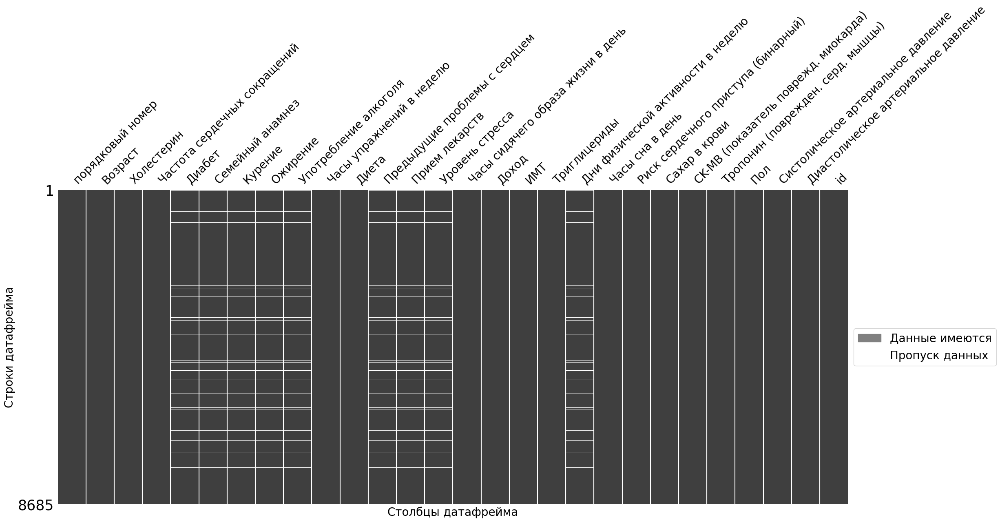

In [28]:
#воспользуемся missngno, чтобы проверить есть ли зависимость между этими столбцами
#диаграмм отражения пропущеннывх данных
import matplotlib.patches as mpatches
msno.matrix(heart_train_ru, sparkline=False, fontsize=20, labels=True);
gray_patch = mpatches.Patch(color='gray', label='Данные имеются')
white_patch = mpatches.Patch(color='white', label='Пропуск данных')
plt.legend(handles=[gray_patch, white_patch], fontsize=20, loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Строки датафрейма', fontsize=20)
plt.xlabel('Столбцы датафрейма', fontsize=20)
plt.show()

- видим, что это одни и теже люди, записи, их 243, пропущено что от общего количества представленного в датасете (8685чел.) это 2.8%
- удалив это количество людей, записей в датасете, мы не сильно потеряем в датасете
- 9 признаков из 27ми (33%), такие как курение, ожирение итд сильно должны влиять на целевой признак - риск сердечных заболеваний, а по ним для 243 записей пропуски. мы могли бы оставить их, но рассматривать целевой признак риск сердечных заболеваний, строить модель МО с людьми без таких признаков не корректно.
- (конечно модель может обучиться и на остальных признаках, но по смыслу эти признаки обязаны участвовать в обучении модели и вляить на целевой признак)
- **В совокупности доводов выше - удалим 243 записи с пропусками, 2.8% данных датасета, что позволит точнее обучить модель, учесть вляинеие признаков с данными на целевой признак **  

In [29]:
heart_train_ru = heart_train_ru.dropna()
heart_train_ru.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8442 entries, 0 to 8684
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      8442 non-null   int64   
 1   Возраст                               8442 non-null   float64 
 2   Холестерин                            8442 non-null   float64 
 3   Частота сердечных сокращений          8442 non-null   float64 
 4   Диабет                                8442 non-null   float64 
 5   Семейный анамнез                      8442 non-null   float64 
 6   Курение                               8442 non-null   float64 
 7   Ожирение                              8442 non-null   float64 
 8   Употребление алкоголя                 8442 non-null   float64 
 9   Часы упражнений в неделю              8442 non-null   float64 
 10  Диета                                 8442 non-null   category
 11  Пред

- **пропуски удалены**

- следующие признаки имеют булевый тип по смыслу: `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Риск сердечного приступа (бинарный)`  

In [30]:
#произведем замену некоторых признаков на тип булевый
heart_train_ru['Диабет'] = heart_train_ru['Диабет'].astype('bool')
heart_train_ru['Семейный анамнез'] = heart_train_ru['Семейный анамнез'].astype('bool')
heart_train_ru['Курение'] = heart_train_ru['Курение'].astype('bool')
heart_train_ru['Ожирение'] = heart_train_ru['Ожирение'].astype('bool')
heart_train_ru['Употребление алкоголя'] = heart_train_ru['Употребление алкоголя'].astype('bool')
heart_train_ru['Предыдущие проблемы с сердцем'] = heart_train_ru['Предыдущие проблемы с сердцем'].astype('bool')
heart_train_ru['Прием лекарств'] = heart_train_ru['Прием лекарств'].astype('bool')
heart_train_ru['Риск сердечного приступа (бинарный)'] = heart_train_ru['Риск сердечного приступа (бинарный)'].astype('bool')
# проверка
heart_train_ru.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8442 entries, 0 to 8684
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      8442 non-null   int64   
 1   Возраст                               8442 non-null   float64 
 2   Холестерин                            8442 non-null   float64 
 3   Частота сердечных сокращений          8442 non-null   float64 
 4   Диабет                                8442 non-null   bool    
 5   Семейный анамнез                      8442 non-null   bool    
 6   Курение                               8442 non-null   bool    
 7   Ожирение                              8442 non-null   bool    
 8   Употребление алкоголя                 8442 non-null   bool    
 9   Часы упражнений в неделю              8442 non-null   float64 
 10  Диета                                 8442 non-null   category
 11  Пред

- **замена прошла успешно**

### 2.1.3 Поиск и замена дубликатов в тренировочной выборке

In [31]:
# так как большинство данных float, несколько признаков категориальных, поэтому правильнее проверить дубликаты в id, что у нас нет в базе дублирующих людей
heart_train_ru['id'].duplicated().sum()

0

- **дубликаты id в тренировочной выборке отсуствуют**
- остальные данные типа float и category, искать неявные дубликаты безсмысленно

## 2.2 Предобработка данных тестовой выборки 

In [32]:
#выведем инфо по тренировочной выборке
heart_test_ru.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 966 entries, 0 to 965
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   порядковый номер                      966 non-null    int64  
 1   Возраст                               966 non-null    float64
 2   Холестерин                            966 non-null    float64
 3   Частота сердечных сокращений          966 non-null    float64
 4   Диабет                                935 non-null    float64
 5   Семейный анамнез                      935 non-null    float64
 6   Курение                               935 non-null    float64
 7   Ожирение                              935 non-null    float64
 8   Употребление алкоголя                 935 non-null    float64
 9   Часы упражнений в неделю              966 non-null    float64
 10  Диета                                 966 non-null    int64  
 11  Предыдущие проблемы

- **отмечаем пропуски по столбцам;**
- **тип данных признаков идентичен тренировочной выборке, произведем замену типа признаков стого как в тренировочной выборке**

In [33]:
#выведем describe (описание) по тестовой выборке
heart_test_ru.describe().T

,count,mean,std,min,25%,50%,75%,max
порядковый номер,966.0,482.500000,279.004480,0.000000,241.250000,482.500000,723.750000,965.000000
Возраст,966.0,0.452916,0.231068,0.044944,0.247191,0.460674,0.640449,0.853933
Холестерин,966.0,0.488181,0.282039,0.000000,0.243750,0.499780,0.710714,0.996429
Частота сердечных сокращений,966.0,0.051644,0.035502,0.000000,0.036664,0.050412,0.065995,1.000000
Диабет,935.0,0.656684,0.475070,0.000000,0.000000,1.000000,1.000000,1.000000
Семейный анамнез,935.0,0.481283,0.499917,0.000000,0.000000,0.000000,1.000000,1.000000
Курение,935.0,0.898396,0.302289,0.000000,1.000000,1.000000,1.000000,1.000000
Ожирение,935.0,0.516578,0.499993,0.000000,0.000000,1.000000,1.000000,1.000000
Употребление алкоголя,935.0,0.583957,0.493165,0.000000,0.000000,1.000000,1.000000,1.000000
Часы упражнений в неделю,966.0,0.490706,0.284902,0.000336,0.243431,0.502110,0.734425,0.998938


### 2.2.1 Преобразование и замена типа данных признаков тестовой выборки

In [34]:
#### произведем замену типа данных признаков `Диета` `Уровень стресса` на категориальный
heart_test_ru['Диета'] = heart_test_ru['Диета'].astype('category')
heart_test_ru['Уровень стресса'] = heart_test_ru['Уровень стресса'].astype('category')

In [35]:
# отнормируем признак
heart_test_ru['Дни физической активности в неделю'] = heart_test_ru['Дни физической активности в неделю']/7

- признак: `Пол` имеет по смыслу булевй тип, произведем замену на 1 - мужской, 0 - женский

In [36]:
# выведем уникальные значения пола, на проверку не явных дубликатов
heart_train_ru['Пол'].unique()

array([ True, False])

- среди уникальных данных есть значения 1 и 0, предположим, что 1 - мужской пол, 0 - женский пол

In [37]:
# Произведем замену 1 - мужской, 0 - женский
heart_test_ru['Пол'] = heart_test_ru['Пол'].apply(lambda x: 1 if x == 'male' else 0)
heart_test_ru['Пол'] = heart_test_ru['Пол'].astype('bool')

In [38]:
#выведем инфо по тренировочной выборке
heart_test_ru.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 966 entries, 0 to 965
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      966 non-null    int64   
 1   Возраст                               966 non-null    float64 
 2   Холестерин                            966 non-null    float64 
 3   Частота сердечных сокращений          966 non-null    float64 
 4   Диабет                                935 non-null    float64 
 5   Семейный анамнез                      935 non-null    float64 
 6   Курение                               935 non-null    float64 
 7   Ожирение                              935 non-null    float64 
 8   Употребление алкоголя                 935 non-null    float64 
 9   Часы упражнений в неделю              966 non-null    float64 
 10  Диета                                 966 non-null    category
 11  Предыд

In [39]:
#выведем describe (описание) по тестовой выборке
heart_test_ru.describe().T

,count,mean,std,min,25%,50%,75%,max
порядковый номер,966.0,482.500000,279.004480,0.000000,241.250000,482.500000,723.750000,965.000000
Возраст,966.0,0.452916,0.231068,0.044944,0.247191,0.460674,0.640449,0.853933
Холестерин,966.0,0.488181,0.282039,0.000000,0.243750,0.499780,0.710714,0.996429
Частота сердечных сокращений,966.0,0.051644,0.035502,0.000000,0.036664,0.050412,0.065995,1.000000
Диабет,935.0,0.656684,0.475070,0.000000,0.000000,1.000000,1.000000,1.000000
Семейный анамнез,935.0,0.481283,0.499917,0.000000,0.000000,0.000000,1.000000,1.000000
Курение,935.0,0.898396,0.302289,0.000000,1.000000,1.000000,1.000000,1.000000
Ожирение,935.0,0.516578,0.499993,0.000000,0.000000,1.000000,1.000000,1.000000
Употребление алкоголя,935.0,0.583957,0.493165,0.000000,0.000000,1.000000,1.000000,1.000000
Часы упражнений в неделю,966.0,0.490706,0.284902,0.000336,0.243431,0.502110,0.734425,0.998938


- **Все наши преобразования прошли успешно**

### 2.2.2 Замена пропусков в тестовой выборке

In [40]:
#выведем сколько и какие столбцы имеют пропуски в тренировочной выборке
heart_test_ru.isna().sum()

порядковый номер                         0
Возраст                                  0
Холестерин                               0
Частота сердечных сокращений             0
Диабет                                  31
Семейный анамнез                        31
Курение                                 31
Ожирение                                31
Употребление алкоголя                   31
Часы упражнений в неделю                 0
Диета                                    0
Предыдущие проблемы с сердцем           31
Прием лекарств                          31
Уровень стресса                         31
Часы сидячего образа жизни в день        0
Доход                                    0
ИМТ                                      0
Триглицериды                             0
Дни физической активности в неделю      31
Часы сна в день                          0
Сахар в крови                            0
CK-MB (показатель поврежд. миокарда)     0
Тропонин (поврежден. серд. мышцы)        0
Пол        

- **31 пропуск по признакам `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Уровень стресса` `Дни физической активности в неделю`**
- **пропуски по таким же признакам как и в тренировочной выборке**

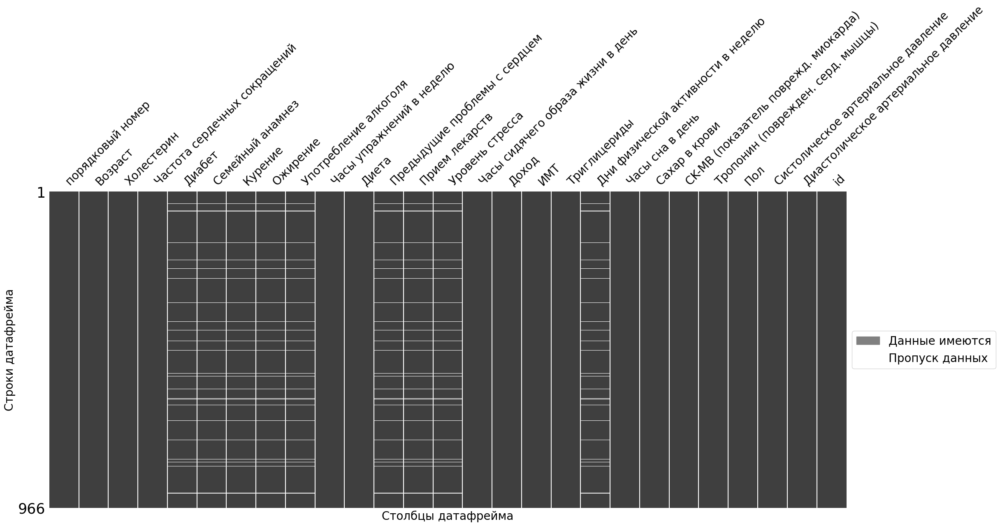

In [41]:
#воспользуемся missngno, чтобы проверить есть ли зависимость между этими столбцами
#диаграмм отражения пропущеннывх данных
import matplotlib.patches as mpatches
msno.matrix(heart_test_ru, sparkline=False, fontsize=20, labels=True);
gray_patch = mpatches.Patch(color='gray', label='Данные имеются')
white_patch = mpatches.Patch(color='white', label='Пропуск данных')
plt.legend(handles=[gray_patch, white_patch], fontsize=20, loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Строки датафрейма', fontsize=20)
plt.xlabel('Столбцы датафрейма', fontsize=20)
plt.show()

- аналогично тренировочной выборке, 31 пропуск из 966 записей (3.2%)  по 9ти признакам из 27-ми (33%)  пропущено.
- **удалим эти записи, мы не потреям в объеме рассматриваемых данных, но мы исключаем то что люди в отсуствии этих признаков (важных признаков по смыслу) будут прогоняться через модель МО и отражать метрику** 

In [42]:
heart_test_ru = heart_test_ru.dropna()
heart_test_ru.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 935 entries, 0 to 965
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      935 non-null    int64   
 1   Возраст                               935 non-null    float64 
 2   Холестерин                            935 non-null    float64 
 3   Частота сердечных сокращений          935 non-null    float64 
 4   Диабет                                935 non-null    float64 
 5   Семейный анамнез                      935 non-null    float64 
 6   Курение                               935 non-null    float64 
 7   Ожирение                              935 non-null    float64 
 8   Употребление алкоголя                 935 non-null    float64 
 9   Часы упражнений в неделю              935 non-null    float64 
 10  Диета                                 935 non-null    category
 11  Предыд

- **пропуски удалены**

- следующие признаки имеют булевый тип по смыслу: `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Риск сердечного приступа (бинарный)`  

In [43]:
#произведем замену некоторых признаков на тип булевый
heart_test_ru['Диабет'] = heart_test_ru['Диабет'].astype('bool')
heart_test_ru['Семейный анамнез'] = heart_test_ru['Семейный анамнез'].astype('bool')
heart_test_ru['Курение'] = heart_test_ru['Курение'].astype('bool')
heart_test_ru['Ожирение'] = heart_test_ru['Ожирение'].astype('bool')
heart_test_ru['Употребление алкоголя'] = heart_test_ru['Употребление алкоголя'].astype('bool')
heart_test_ru['Предыдущие проблемы с сердцем'] = heart_test_ru['Предыдущие проблемы с сердцем'].astype('bool')
heart_test_ru['Прием лекарств'] = heart_test_ru['Прием лекарств'].astype('bool')
# проверка
heart_test_ru.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 935 entries, 0 to 965
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      935 non-null    int64   
 1   Возраст                               935 non-null    float64 
 2   Холестерин                            935 non-null    float64 
 3   Частота сердечных сокращений          935 non-null    float64 
 4   Диабет                                935 non-null    bool    
 5   Семейный анамнез                      935 non-null    bool    
 6   Курение                               935 non-null    bool    
 7   Ожирение                              935 non-null    bool    
 8   Употребление алкоголя                 935 non-null    bool    
 9   Часы упражнений в неделю              935 non-null    float64 
 10  Диета                                 935 non-null    category
 11  Предыд

- **замена прошла успешно**

### 2.2.3 Поиск и замена дубликатов в тренировочной выборке

In [44]:
# так как большинство данных float, несколько признаков категориальных, поэтому правильнее проверить дубликаты в id, что у нас нет в базе дублирующих людей
heart_test_ru['id'].duplicated().sum()

0

- **дубликаты id в тестовой выборке отсуствуют**
- остальные данные типа float и category, искать неявные дубликаты безсмысленно

# Выводы по предобработке данных
**Тренировочная выборка:** <br>
*Первичное преобразование и замена типа данных*
1. Исходя из таблицы describe и рассмотренных рандомных значений можно предположить, что признаки, которые по смыслу должны иметь значения десятого порядка нормализованы
2. имеются признаки булевого типа (0,1) по смыслу, но float по факту.**Произведем замену типа данных по bool после замены пропусков**
3. Два признака имеют значения больше 1, по смыслу такие признаки можно отнести к типу категориальные: `Диета` `Уровень стресса`
4. 1 признак `Дни физической активности в неделю` имеют значения от 1 до 7, один признак среди всех не отнормирован
5. - следующие признаки имеют булевый тип по смыслу: `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Риск сердечного приступа (бинарный)` **заменили на булевый тип**
6. - признак: `Пол` имеет по смыслу булевй тип, произвили замену на 1 - мужской, 0 - женский и булевый тип. (среди уникальных данных есть значения 1 и 0, предположим, что 1 - мужской пол, 0 - женский пол)
7. **признаки имеющие значения и по смыслу относящиеся к категориальным (`Диета`, `Уровень стресса`), сделаем категориальными, чтобы они случайно не были использованы в моели МО в численных признаках**
8. **признак `Дни физической активности в неделю` отнормируем (разделим на максимум дней в неделю 7)** <br>
   
*Замена пропусков*
1. 243 пропуска по признакам `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Уровень стресса` `Дни физической активности в неделю`
2. **удалили 243 записи с пропусками, 2.8% данных датасета, ввиду не большого объема данных и так как пропущены одни из ключевых признаков влияющих на целевой признак** <br>
   
*Поиск и замена дубликатов*
1. **дубликаты id в тренировочной выборке отсуствуют**
2. остальные данные типа float, bool, category, искать неявные дубликаты безсмысленно <br>

**Тестовая выборка:** <br>
*Первичное преобразование и замена типа данных*
1. **отмечаем пропуски по столбцам**
2. **тип данных признаков идентичен тренировочной выборке, произведем замену типа признаков строго как в тренировочной выборке**
3. признак `Дни физической активности в неделю` имеют значения от 1 до 7, один признак среди всех не отнормирован
5. - следующие признаки имеют булевый тип по смыслу: `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Риск сердечного приступа (бинарный)` **заменили на булевый тип**
6. - признак: `Пол` имеет по смыслу булевй тип, произвили замену на 1 - мужской, 0 - женский и булеевый тип (среди уникальных данных есть значения 1 и 0, предположим, что 1 - мужской пол, 0 - женский пол)<br>

*Замена пропусков*
1. 31 пропуск из 966 записей (3.2%)  по 9ти признакам из 27-ми (33%)  пропущено. (признаки: `Диабет` `Семейный анамнез` `Курение` `Ожирение` `Употребление алкоголя` `Предыдущие проблемы с сердцем` `Прием лекарств` `Уровень стресса` `Дни физической активности в неделю`)
2. удалим эти записи, исключаем то что люди в отсуствии этих признаков (важных признаков) будут прогоняться через модель МО и отражать метрику<br>

*Поиск и замена дубликатов*
- **дубликаты id в тестовой выборке отсуствуют**
- остальные данные типа float, bool, category, искать неявные дубликаты безсмысленно

# 3. Исследовательский анализ данных

## 3.1 Исследовательский анализ тренировочной выборки

## 3.1.1 Исследование признаков типа float

напшием функцию, для данных типа float, которая повзолит строить гистограмму ящик с уссами для анализа признака

In [45]:
def plot_hist_boxplot_float(df, column_name):
    """
    Функция для построения гистограммы и boxplot указанного столбца
    
    Параметры:
    df - pandas DataFrame
    column_name - имя столбца для анализа (str)
    """
    # Выводим статистики
    print(f"Статистика для столбца '{column_name}':")
    print(df[column_name].describe())
    print("\n" + "="*50 + "\n")  # Разделитель для удобства чтения
    plt.figure(figsize=(10, 5))
    
    # Гистограмма
    plt.subplot(1, 2, 1)
    plt.hist(df[column_name], bins=100)
    plt.ylabel('Количество')
    plt.xlabel(column_name)
    plt.title(f'Распределение {column_name}')
    
    # # Boxplot
    # plt.subplot(1, 2, 2)
    # sns.boxplot(df[column_name]).set(
    #     xlabel=column_name, 
    #     title=f'Распределение {column_name}'
    # )
    
    plt.autoscale()
    plt.tight_layout()
    plt.show()

In [46]:
#выведем эту таблицу, чтобы подставлять признаки в функцию
heart_train_ru.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8442 entries, 0 to 8684
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      8442 non-null   int64   
 1   Возраст                               8442 non-null   float64 
 2   Холестерин                            8442 non-null   float64 
 3   Частота сердечных сокращений          8442 non-null   float64 
 4   Диабет                                8442 non-null   bool    
 5   Семейный анамнез                      8442 non-null   bool    
 6   Курение                               8442 non-null   bool    
 7   Ожирение                              8442 non-null   bool    
 8   Употребление алкоголя                 8442 non-null   bool    
 9   Часы упражнений в неделю              8442 non-null   float64 
 10  Диета                                 8442 non-null   category
 11  Пред

Статистика для столбца 'Возраст':
count    8442.000000
mean        0.449008
std         0.232809
min         0.044944
25%         0.247191
50%         0.460674
75%         0.640449
max         0.853933
Name: Возраст, dtype: float64




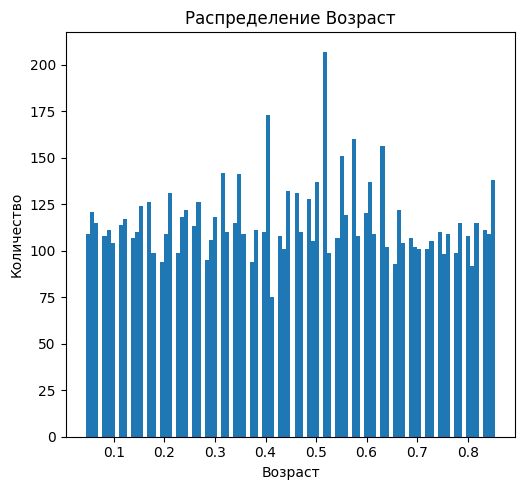

In [47]:
plot_hist_boxplot_float(heart_train_ru, 'Возраст')

- по признаку `возвраст` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных

Статистика для столбца 'Холестерин':
count    8442.000000
mean        0.501108
std         0.288785
min         0.000000
25%         0.260714
50%         0.496429
75%         0.750000
max         1.000000
Name: Холестерин, dtype: float64




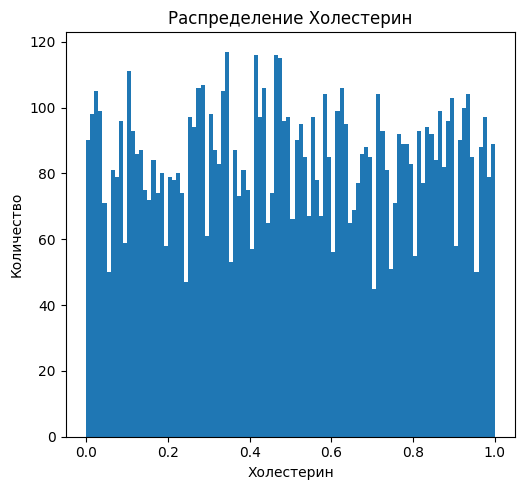

In [48]:
plot_hist_boxplot_float(heart_train_ru, 'Холестерин')

- по признаку `холестерин распределение равномерное, выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель холестрина не может быть 0

In [49]:
# выведем сколько данных с значением признака `холестерин` 0
percentage = (heart_train_ru['Холестерин'] == 0).sum() / len(heart_train_ru) * 100
print(f'Процент данных со значением холестерина=0: {percentage.round(4)}%')

Процент данных со значением холестерина=0: 0.3672%


- таких данных 0,36%, проведем исследования всех признаков и решим, что делать с такими данными

Статистика для столбца 'Частота сердечных сокращений':
count    8442.000000
mean        0.050194
std         0.018442
min         0.018332
25%         0.034830
50%         0.050412
75%         0.065995
max         0.082493
Name: Частота сердечных сокращений, dtype: float64




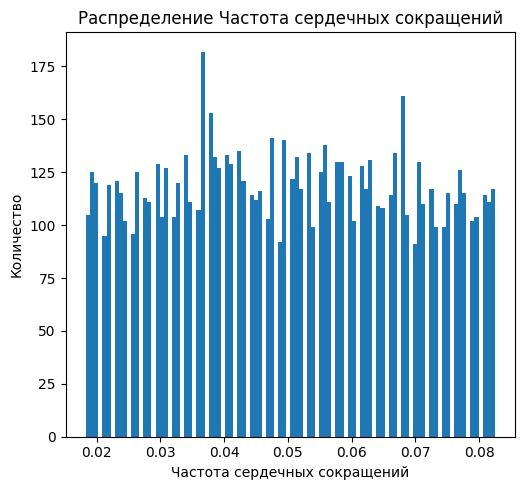

In [50]:
plot_hist_boxplot_float(heart_train_ru, 'Частота сердечных сокращений')

- по признаку `Частота сердечных сокращений` распределение равномерное, выбросов нет, мин макс логичны

Статистика для столбца 'Часы упражнений в неделю':
count    8442.000000
mean        0.503415
std         0.288881
min         0.000000
25%         0.253359
50%         0.508244
75%         0.754901
max         1.000000
Name: Часы упражнений в неделю, dtype: float64




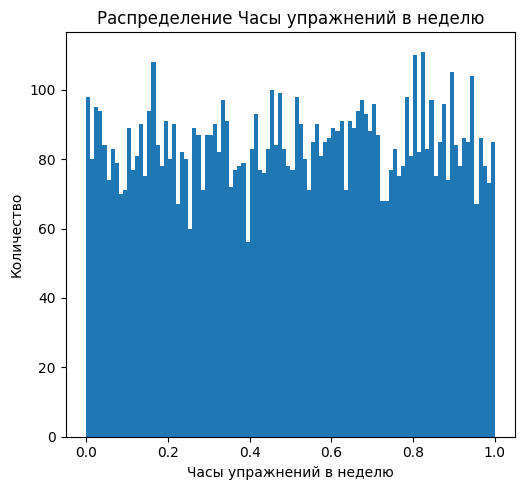

In [51]:
plot_hist_boxplot_float(heart_train_ru, 'Часы упражнений в неделю')

- по признаку `Частота упражнений в неделю` распределение равномерное, выбросов нет, мин макс логичны

Статистика для столбца 'Часы сидячего образа жизни в день':
count    8442.000000
mean        0.499142
std         0.289418
min         0.000000
25%         0.247650
50%         0.492734
75%         0.751047
max         1.000000
Name: Часы сидячего образа жизни в день, dtype: float64




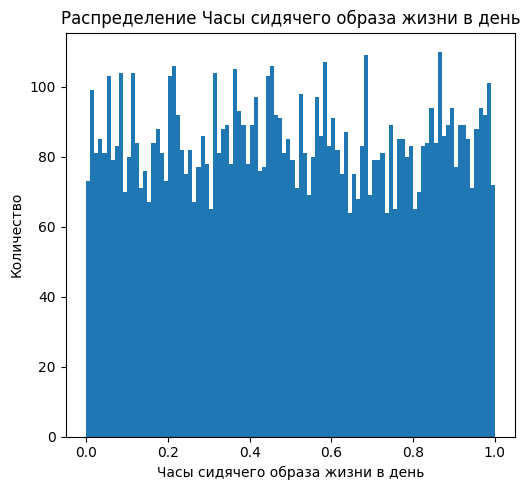

In [52]:
plot_hist_boxplot_float(heart_train_ru, 'Часы сидячего образа жизни в день')

- по признаку `Часы сидячего образа жизни в день` распределение равномерное, выбросов нет, мин макс логичны

Статистика для столбца 'Доход':
count    8442.000000
mean        0.496089
std         0.288767
min         0.000000
25%         0.244591
50%         0.496052
75%         0.747603
max         1.000000
Name: Доход, dtype: float64




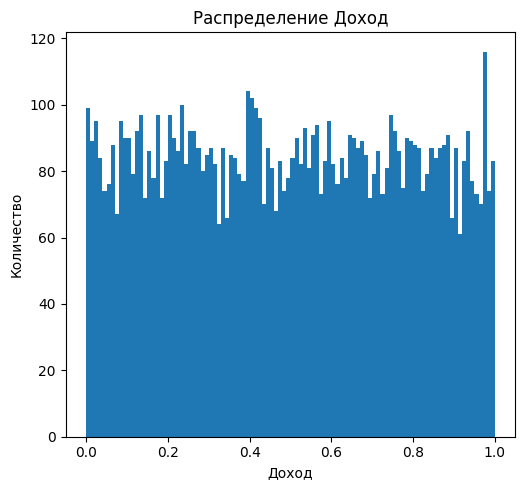

In [53]:
plot_hist_boxplot_float(heart_train_ru, 'Доход')

- по признаку `Доход` распределение равномерное, выбросов нет, мин макс логичны, есть значение 0, что может интерпретироваться как отсуствие дохода

Статистика для столбца 'ИМТ':
count    8442.000000
mean        0.496831
std         0.286599
min         0.000000
25%         0.247935
50%         0.490801
75%         0.744399
max         1.000000
Name: ИМТ, dtype: float64




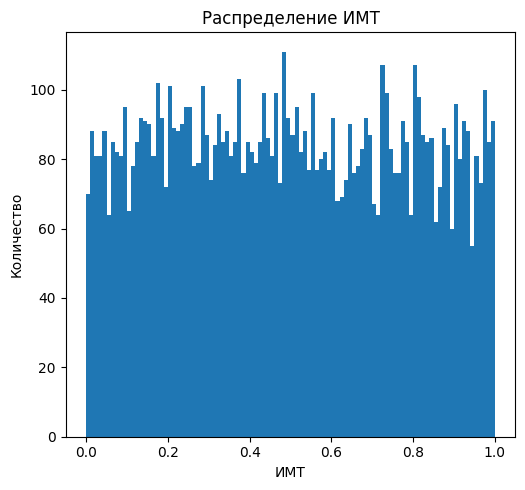

In [54]:
plot_hist_boxplot_float(heart_train_ru, 'ИМТ')

- по признаку `ИМТ` выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель ИМТ не может быть 0

In [55]:
# выведем сколько данных с значением признака `ИМТ` 0
percentage = (heart_train_ru['ИМТ'] == 0).sum() / len(heart_train_ru) * 100
print(f'Процент данных со значением холестерина=0: {percentage.round(4)}%')

Процент данных со значением холестерина=0: 0.0118%


- таких данных 0,0118%, проведем исследования всех признаков и решим, что делать с такими данными

Статистика для столбца 'Триглицериды':
count    8442.000000
mean        0.505539
std         0.290412
min         0.000000
25%         0.257143
50%         0.507792
75%         0.758442
max         1.000000
Name: Триглицериды, dtype: float64




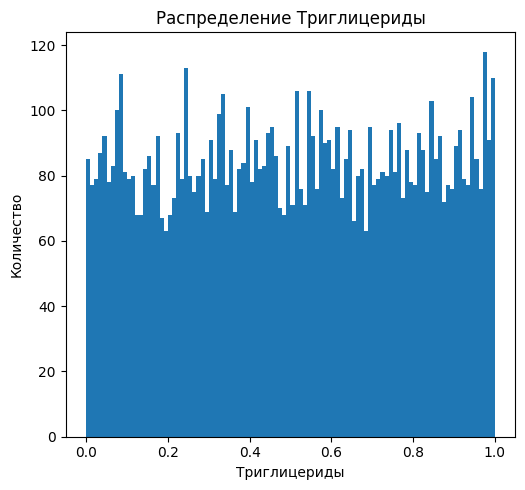

In [56]:
plot_hist_boxplot_float(heart_train_ru, 'Триглицериды')

- по признаку `Триглицериды` выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель Триглицериды не может быть 0

In [57]:
# выведем сколько данных с значением признака `Триглицериды` 0
percentage = (heart_train_ru['Триглицериды'] == 0).sum() / len(heart_train_ru) * 100
print(f'Процент данных со значением холестерина=0: {percentage.round(4)}%')

Процент данных со значением холестерина=0: 0.1777%


- таких данных 0,17%, проведем исследования всех признаков и решим, что делать с такими данными

Статистика для столбца 'Часы сна в день':
count    8442.000000
mean        0.503712
std         0.332749
min         0.000000
25%         0.166667
50%         0.500000
75%         0.833333
max         1.000000
Name: Часы сна в день, dtype: float64




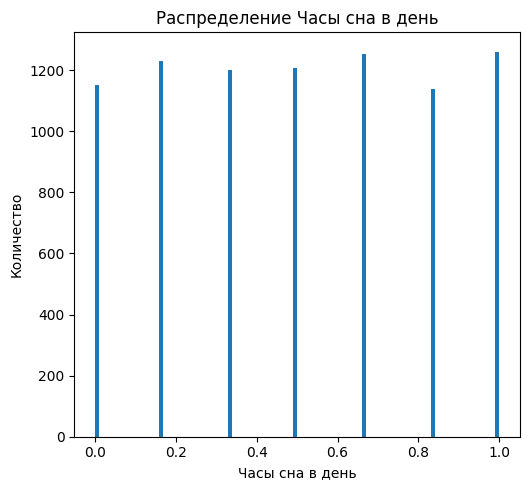

In [58]:
plot_hist_boxplot_float(heart_train_ru, 'Часы сна в день')

- по признаку `Часы сна в день` выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель Часы сна в день не может быть 0

In [59]:
# выведем сколько данных с значением признака `Триглицериды` 0
percentage = (heart_train_ru['Часы сна в день'] == 0).sum() / len(heart_train_ru) * 100
print(f'Процент данных со значением холестерина=0: {percentage.round(4)}%')

Процент данных со значением холестерина=0: 13.6579%


- таких данных 13.6%, проведем исследования всех признаков и решим, что делать с такими данными

Статистика для столбца 'Сахар в крови':
count    8442.000000
mean        0.227998
std         0.074623
min         0.000000
25%         0.227018
50%         0.227018
75%         0.227018
max         1.000000
Name: Сахар в крови, dtype: float64




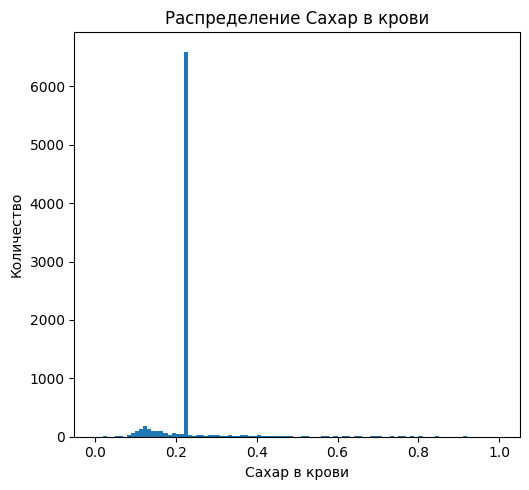

In [60]:
plot_hist_boxplot_float(heart_train_ru, 'Сахар в крови')

- по признаку `Сахар в крови` наблюдается аномальное количество со значением примерно 0,22, макс логичен, мин - кажется подозрительным, значение 0, показатель Сахар в крови не может быть 0

In [61]:
# выведем сколько данных с значением признака `Сахар в крови` 0

# получаем данные о столбцах
counts, bins = np.histogram(heart_train_ru['Сахар в крови'], bins=100)

# Находим самый высокий столбец
max_bin_index = np.argmax(counts)
anomaly_bin_left = bins[max_bin_index]
anomaly_bin_right = bins[max_bin_index + 1]

print(f"Аномальный диапазон: от {anomaly_bin_left:.2f} до {anomaly_bin_right:.2f}")
print(f"Количество значений в этом диапазоне: {counts[max_bin_index]}")

# Расчет процента аномальных значений
total_values = len(heart_train_ru)
anomaly_count = counts[max_bin_index]
anomaly_percent = (anomaly_count / total_values) * 100

print(f"\nПроцент аномальных значений: {anomaly_percent:.2f}%")

Аномальный диапазон: от 0.22 до 0.23
Количество значений в этом диапазоне: 6594

Процент аномальных значений: 78.11%


- **78% данных имеют значение Сахара в крови 0,22-0,23, возможно это норма, а остальные значения это отклонения, оставим данные как есть**

In [62]:
# выведем сколько данных с заномальным количеством`Сахар в крови` примерно 0,22
percentage = (heart_train_ru['Часы сна в день'] == 0).sum() / len(heart_train_ru) * 100
print(f'Процент данных со значением холестерина=0: {percentage.round(4)}%')

Процент данных со значением холестерина=0: 13.6579%


- таких данных 13.6%, проведем исследования всех признаков и решим, что делать с такими данными. **Стоить отметить, что ровно такой же процент у признака `Часы сна в день`**

Статистика для столбца 'CK-MB (показатель поврежд. миокарда)':
count    8442.000000
mean        0.047745
std         0.070399
min         0.000000
25%         0.048229
50%         0.048229
75%         0.048229
max         1.000000
Name: CK-MB (показатель поврежд. миокарда), dtype: float64




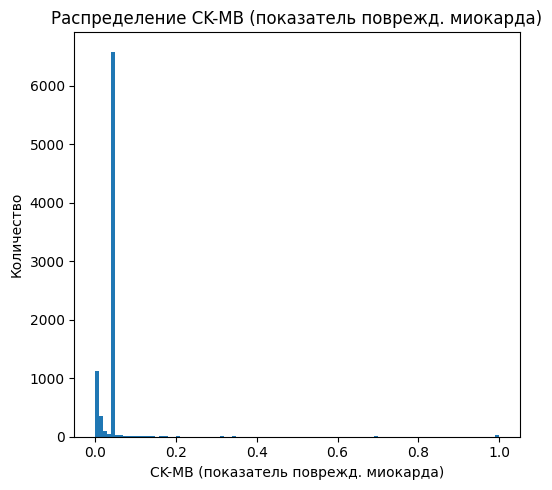

In [63]:
plot_hist_boxplot_float(heart_train_ru, 'CK-MB (показатель поврежд. миокарда)')

- по признаку `CK-MB (показатель поврежд. миокарда)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс

Статистика для столбца 'Тропонин (поврежден. серд. мышцы)':
count    8442.000000
mean        0.036867
std         0.059284
min         0.000000
25%         0.036512
50%         0.036512
75%         0.036512
max         1.000000
Name: Тропонин (поврежден. серд. мышцы), dtype: float64




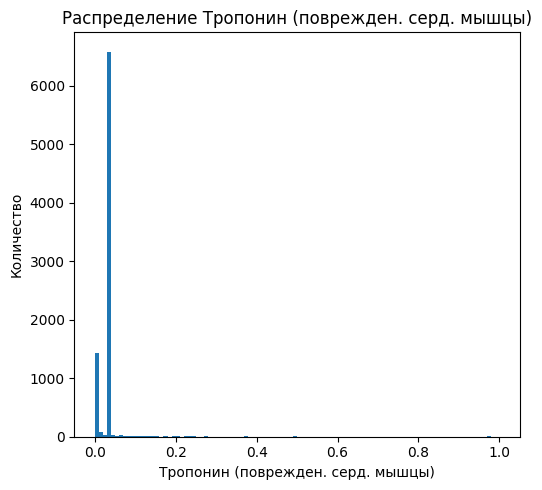

In [64]:
plot_hist_boxplot_float(heart_train_ru, 'Тропонин (поврежден. серд. мышцы)')

- по признаку `Тропонин (поврежден. серд. мышцы)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс

Статистика для столбца 'Систолическое артериальное давление':
count    8442.000000
mean        0.451955
std         0.170187
min         0.161290
25%         0.303226
50%         0.451613
75%         0.600000
max         0.741935
Name: Систолическое артериальное давление, dtype: float64




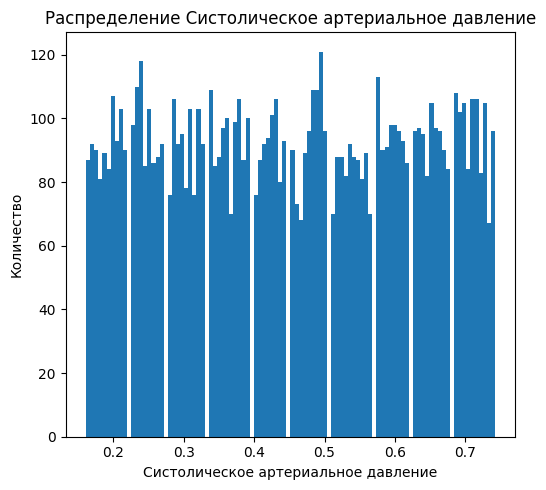

In [65]:
plot_hist_boxplot_float(heart_train_ru, 'Систолическое артериальное давление')

- по признаку `Систолическое артериальное давление` выбросов нет, мин макс логичен, отсуствует значение 0

Статистика для столбца 'Диастолическое артериальное давление':
count    8442.000000
mean        0.501672
std         0.170302
min         0.209302
25%         0.348837
50%         0.500000
75%         0.651163
max         0.790698
Name: Диастолическое артериальное давление, dtype: float64




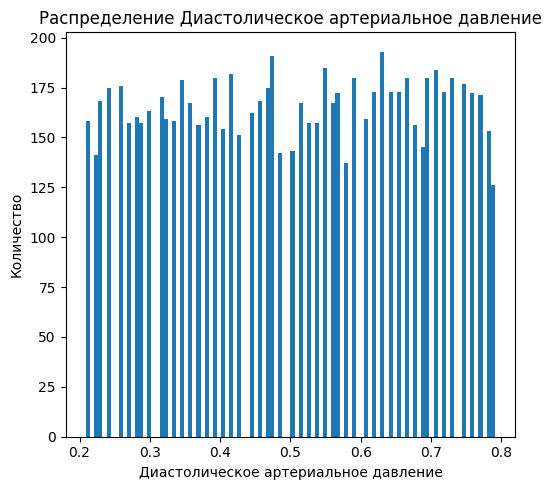

In [66]:
plot_hist_boxplot_float(heart_train_ru, 'Диастолическое артериальное давление')

- по признаку `Диастолическое артериальное давление` выбросов нет, мин макс логичен, отсуствует значение 0

## 3.1.2 Выводы и преоброазование датасета

Имеем не физичные данные <br>
1. по признаку `Холестерин` значение 0, показатель холестрина не может быть 0. **Таких данных 0,36%**
2. по признаку `ИМТ` значение 0, показатель ИМТ не может быть 0. **Таких данных 0,0118%**
3. по признаку `Триглицериды` значение 0, показатель Триглицериды не может быть 0. **Таких данных 0,17%**
4. по признаку `Часы сна в день` значение 0, показатель Часы сна в день не может быть 0. **Таких данных 13.6%**
5. по признаку `Сахар в крови` значение 0, показатель Сахар в крови не может быть 0. **Таких данных 13.6%**
**Произведем замену нулевых значений на среднее значение по данным** <br>
***По признакам `холестерин` `ИМТ` `Триглицериды` это менее процента данных*** <br>
***По признаку `Часы сна в день` это допустимо предположить что люди спят в среднем среднее число часов по выборке в присутствии значения 0*** <br>
***По признаку `Сахар в крови` это допустимо предположить что у людей при значении 0 будет среднее значение по выборке, ранее мы отмечали что 78% данных имеют значение 0,22-0,23*** <br>
**После преобразований это будет датасет с названием heart_train_ru_v1** <br>

In [67]:
# сделаем глубокую копию датасета
heart_train_ru_v1 = copy.deepcopy(heart_train_ru)

In [68]:
# Вычисляем среднее значение столбца (исключая нули)
mean_value_h = heart_train_ru_v1[heart_train_ru_v1['Холестерин'] != 0]['Холестерин'].mean()

# Заменяем нули на среднее
heart_train_ru_v1['Холестерин'] = heart_train_ru_v1['Холестерин'].apply(lambda x: mean_value_h if x == 0 else x)

mean_value_imt = heart_train_ru_v1[heart_train_ru_v1['ИМТ'] != 0]['ИМТ'].mean()
heart_train_ru_v1['ИМТ'] = heart_train_ru_v1['ИМТ'].apply(lambda x: mean_value_imt if x == 0 else x)

mean_value_tr = heart_train_ru_v1[heart_train_ru_v1['Триглицериды'] != 0]['Триглицериды'].mean()
heart_train_ru_v1['Триглицериды'] = heart_train_ru_v1['Триглицериды'].apply(lambda x: mean_value_tr if x == 0 else x)

mean_value_hou = heart_train_ru_v1[heart_train_ru_v1['Часы сна в день'] != 0]['Часы сна в день'].mean()
heart_train_ru_v1['Часы сна в день'] = heart_train_ru_v1['Часы сна в день'].apply(lambda x: mean_value_hou if x == 0 else x)

mean_value_sug = heart_train_ru_v1[heart_train_ru_v1['Сахар в крови'] != 0]['Сахар в крови'].mean()
heart_train_ru_v1['Сахар в крови'] = heart_train_ru_v1['Сахар в крови'].apply(lambda x: mean_value_sug if x == 0 else x)

# проверка
heart_train_ru_v1.describe().T

,count,mean,std,min,25%,50%,75%,max
порядковый номер,8442.0,4341.279673,2509.223278,0.000000,2175.250000,4335.500000,6518.750000,8684.000000
Возраст,8442.0,0.449008,0.232809,0.044944,0.247191,0.460674,0.640449,0.853933
Холестерин,8442.0,0.502954,0.287178,0.003571,0.264286,0.500000,0.750000,1.000000
Частота сердечных сокращений,8442.0,0.050194,0.018442,0.018332,0.034830,0.050412,0.065995,0.082493
Часы упражнений в неделю,8442.0,0.503415,0.288881,0.000000,0.253359,0.508244,0.754901,1.000000
Часы сидячего образа жизни в день,8442.0,0.499142,0.289418,0.000000,0.247650,0.492734,0.751047,1.000000
Доход,8442.0,0.496089,0.288767,0.000000,0.244591,0.496052,0.747603,1.000000
ИМТ,8442.0,0.496890,0.286548,0.000085,0.248032,0.490867,0.744399,1.000000
Триглицериды,8442.0,0.506438,0.289627,0.001299,0.258442,0.507792,0.758442,1.000000
Дни физической активности в неделю,8442.0,0.501185,0.325967,0.000000,0.285714,0.428571,0.857143,1.000000


In [69]:
print(f'Среднее значение Холестерина:{mean_value_h}')
print('')
print(f'Среднее значение ИМТ:{mean_value_imt}')
print('')
print(f'Среднее значение Триглецириды:{mean_value_tr}')
print('')
print(f'Среднее значение Часы сна в день:{mean_value_hou}')
print('')
print(f'Среднее значение Сахар в крови:{mean_value_sug}')
print('')

Среднее значение Холестерина:0.5029544643918678

Среднее значение ИМТ:0.49689019801927137

Среднее значение Триглецириды:0.5064384885317601

Среднее значение Часы сна в день:0.5833904970960809

Среднее значение Сахар в крови:0.22807942797407996



- **преобразование прошло успешно**

## 3.1.3 Исследование признаков типа bool category

In [70]:
#напишем функцию для анализа признаков типа bool category
def analyze_and_plot(df, feature, value_col='id', figsize=(14, 6)):
    """
    Строит сводную таблицу с процентами и комбинированную визуализацию (bar + pie)
    
    Параметры:
    ----------
    df : DataFrame
        Исходный датафрейм
    feature : str
        Название столбца для анализа
    value_col : str, optional
        Столбец для подсчета (по умолчанию 'id')
    figsize : tuple, optional
        Размер графика (по умолчанию (14, 6))
    """
    # Строим сводную таблицу
    pivot_df = (df.pivot_table(
            index=feature,
            values=value_col,
            aggfunc='count'
        )
        .rename(columns={value_col: 'Количество'})
    )
    
    # Добавляем столбец с процентами
    pivot_df['Доля, %'] = (pivot_df['Количество'] / pivot_df['Количество'].sum() * 100).round(2)
    
    # Выводим сводную таблицу
    print(f"Сводная таблица по признаку '{feature}':")
    display(pivot_df)
    
    # Создаем комбинированную визуализацию
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # 1. Столбчатая диаграмма (количество)
    pivot_df['Количество'].plot(kind='bar', ax=ax1, color='grey')
    ax1.set_title('Абсолютные значения')
    ax1.set_ylabel('Количество пользователей')
    ax1.tick_params(axis='x', rotation=45)
    
    # 2. Круговая диаграмма (проценты)
    pivot_df['Доля, %'].plot(
        kind='pie',
        ax=ax2,
        autopct='%1.1f%%',
        startangle=90,
        labels=None,
        pctdistance=0.85,
        textprops={'fontsize': 10}
    )
    ax2.set_title('Процентное соотношение')
    ax2.set_ylabel('')  # Убираем label по оси Y
      
        # Добавляем легенду для pie chart
    ax2.legend(
        labels=[f'{idx} ({pct}%)' for idx, pct in zip(pivot_df.index, pivot_df['Доля, %'])],
        bbox_to_anchor=(1, 0.5),
        loc='center left') 
        
    plt.tight_layout()
    plt.show()

In [71]:
#выведем булевые и категориальные признаки, чтобы подставить их в функцию
heart_train_ru_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8442 entries, 0 to 8684
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   порядковый номер                      8442 non-null   int64   
 1   Возраст                               8442 non-null   float64 
 2   Холестерин                            8442 non-null   float64 
 3   Частота сердечных сокращений          8442 non-null   float64 
 4   Диабет                                8442 non-null   bool    
 5   Семейный анамнез                      8442 non-null   bool    
 6   Курение                               8442 non-null   bool    
 7   Ожирение                              8442 non-null   bool    
 8   Употребление алкоголя                 8442 non-null   bool    
 9   Часы упражнений в неделю              8442 non-null   float64 
 10  Диета                                 8442 non-null   category
 11  Пред

Сводная таблица по признаку 'Диабет':


,Количество,"Доля, %"
Диабет,,
False,2937,34.79
True,5505,65.21


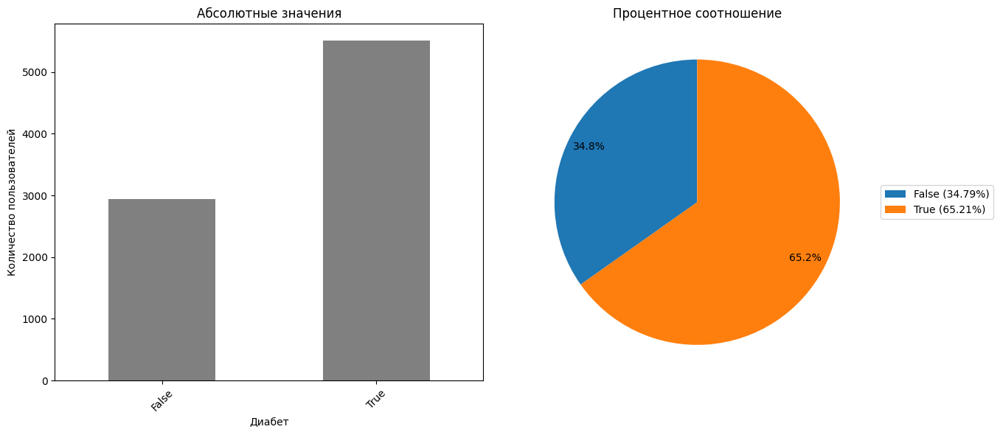

In [72]:
analyze_and_plot(heart_train_ru_v1, 'Диабет')

- **65% имеют диабет, 35% диабета не имееют**

Сводная таблица по признаку 'Семейный анамнез':


,Количество,"Доля, %"
Семейный анамнез,,
False,4309,51.04
True,4133,48.96


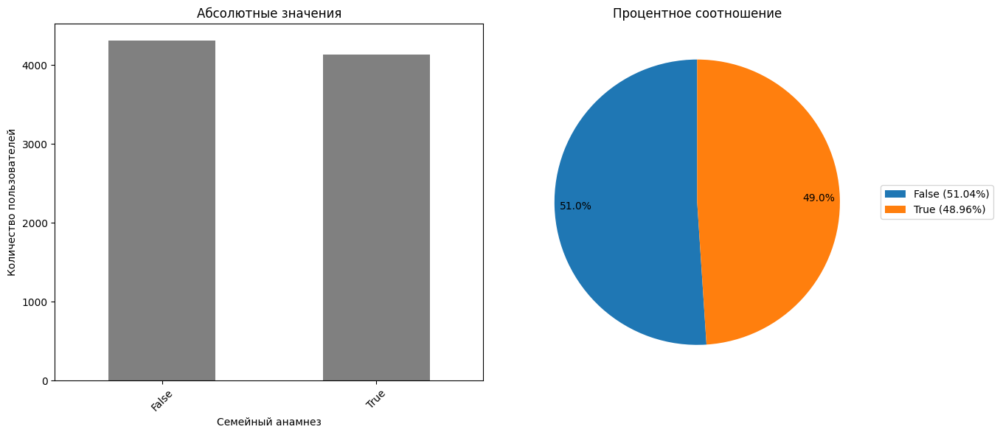

In [73]:
analyze_and_plot(heart_train_ru_v1, 'Семейный анамнез')

- **49% имеют семейный анамнез, 51% семейного анамнеза не имееют**

Сводная таблица по признаку 'Курение':


,Количество,"Доля, %"
Курение,,
False,820,9.71
True,7622,90.29


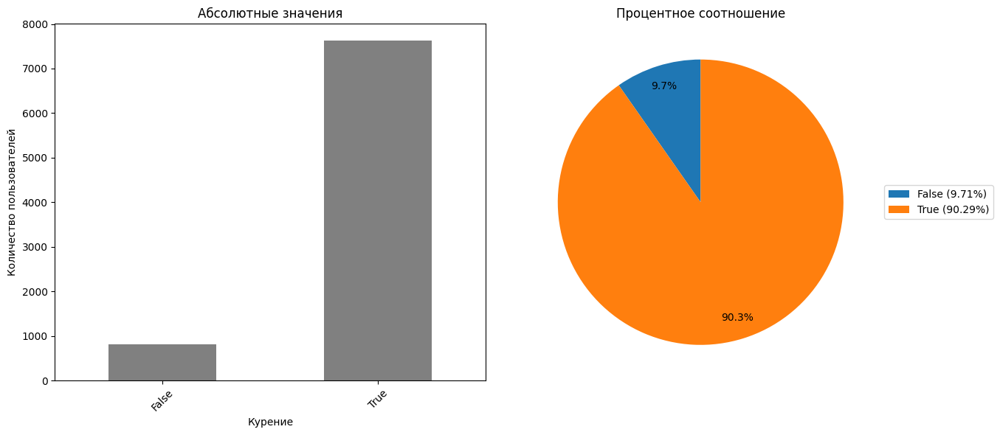

In [74]:
analyze_and_plot(heart_train_ru_v1, 'Курение')

- **91% курят, 9% не курят**

Сводная таблица по признаку 'Ожирение':


,Количество,"Доля, %"
Ожирение,,
False,4235,50.17
True,4207,49.83


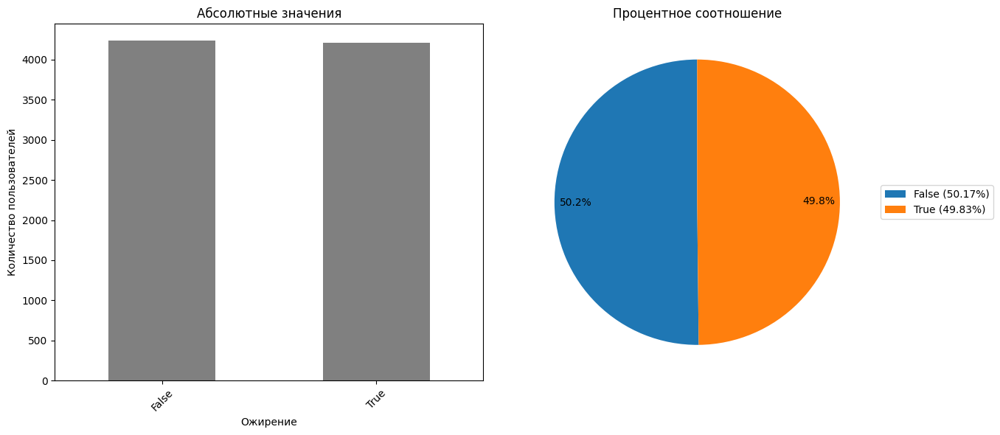

In [75]:
analyze_and_plot(heart_train_ru_v1, 'Ожирение')

- **50% имеют ожирение, 50% ожирения не имееют**

Сводная таблица по признаку 'Употребление алкоголя':


,Количество,"Доля, %"
Употребление алкоголя,,
False,3360,39.8
True,5082,60.2


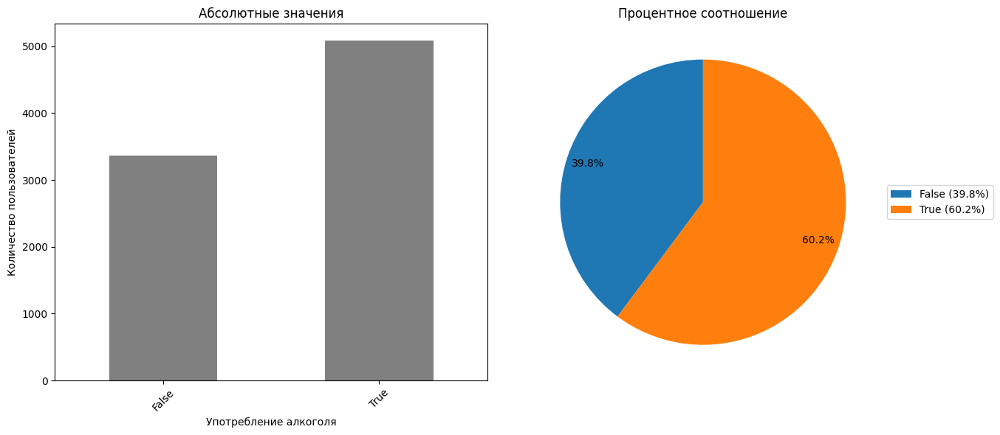

In [76]:
analyze_and_plot(heart_train_ru_v1, 'Употребление алкоголя')

- **60%употребляют алкоголь, 40% алкоголь не употребляют**

Сводная таблица по признаку 'Диета':


,Количество,"Доля, %"
Диета,,
0,2783,32.97
1,2863,33.91
2,2796,33.12
3,0,0.00


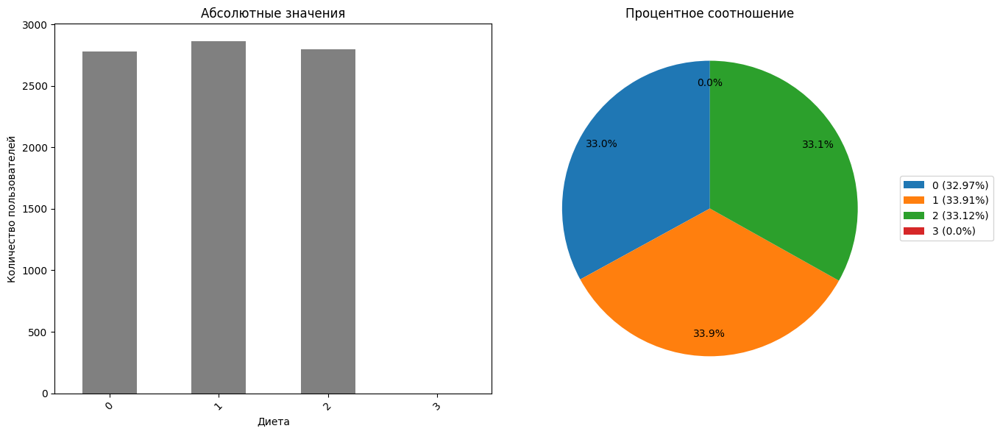

In [77]:
analyze_and_plot(heart_train_ru_v1, 'Диета')

- **примерно по 33 % имеют диету категорий 0 1 2, диету категории 3 нет таких пользователей**

In [78]:
#уникальные значения
heart_train_ru_v1['Диета'].unique()

[1, 2, 0]
Categories (3, int64): [1, 2, 0]

- данные представлены категориями 0 1 2, объявленных категорий 0 1 2 3

Сводная таблица по признаку 'Предыдущие проблемы с сердцем':


,Количество,"Доля, %"
Предыдущие проблемы с сердцем,,
False,4260,50.46
True,4182,49.54


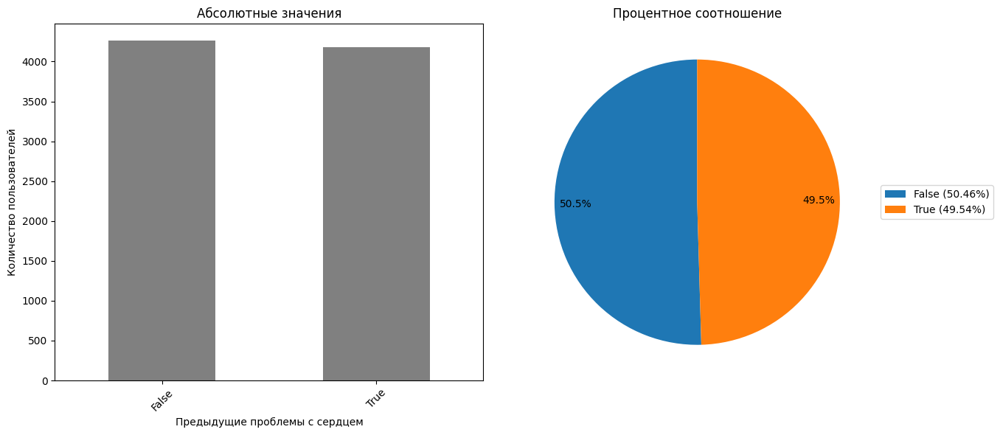

In [79]:
analyze_and_plot(heart_train_ru_v1, 'Предыдущие проблемы с сердцем')

- **50% имеют проблемы с сердцем, 50% не имеют проблем с сердцем**

Сводная таблица по признаку 'Прием лекарств':


,Количество,"Доля, %"
Прием лекарств,,
False,4211,49.88
True,4231,50.12


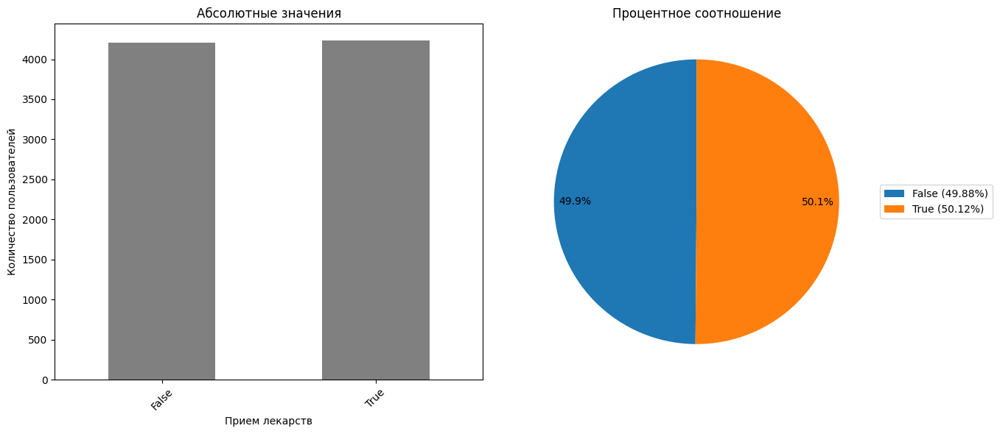

In [80]:
analyze_and_plot(heart_train_ru_v1, 'Прием лекарств')

- **50% принимают лекарства, 50%  не принимают лекарства**

Сводная таблица по признаку 'Уровень стресса':


,Количество,"Доля, %"
Уровень стресса,,
1.0,840,9.95
2.0,854,10.12
3.0,841,9.96
4.0,857,10.15
5.0,833,9.87
6.0,828,9.81
7.0,869,10.29
8.0,844,10.00
9.0,852,10.09


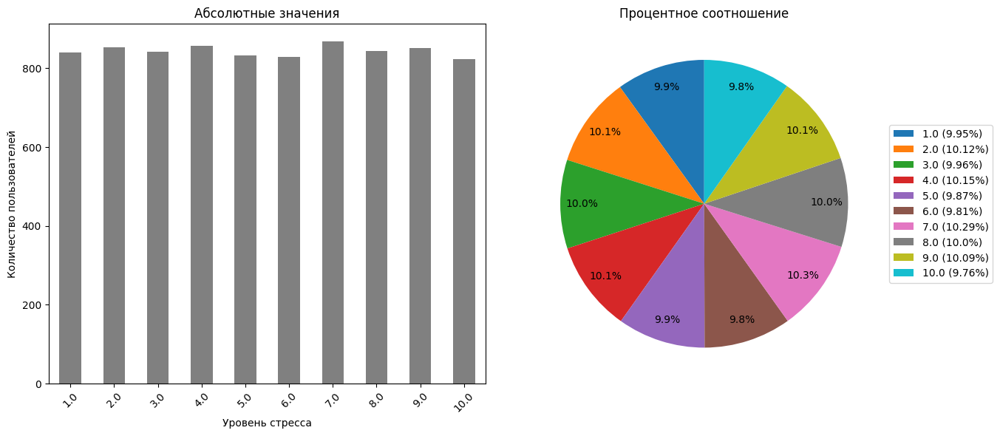

In [81]:
analyze_and_plot(heart_train_ru_v1, 'Уровень стресса')

- **поровну представленны группы по уровню стресса, примерно по 10 % на каждую категорию от 1 до 10**

Сводная таблица по признаку 'Пол':


,Количество,"Доля, %"
Пол,,
False,2560,30.32
True,5882,69.68


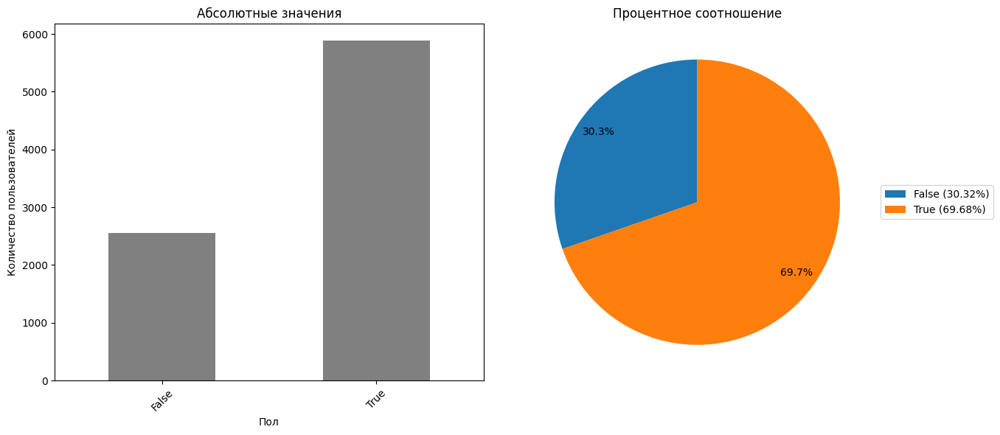

In [82]:
analyze_and_plot(heart_train_ru_v1, 'Пол')

- **70% мужщины, 30% женщины**

Сводная таблица по признаку 'Риск сердечного приступа (бинарный)':


,Количество,"Доля, %"
Риск сердечного приступа (бинарный),,
False,5429,64.31
True,3013,35.69


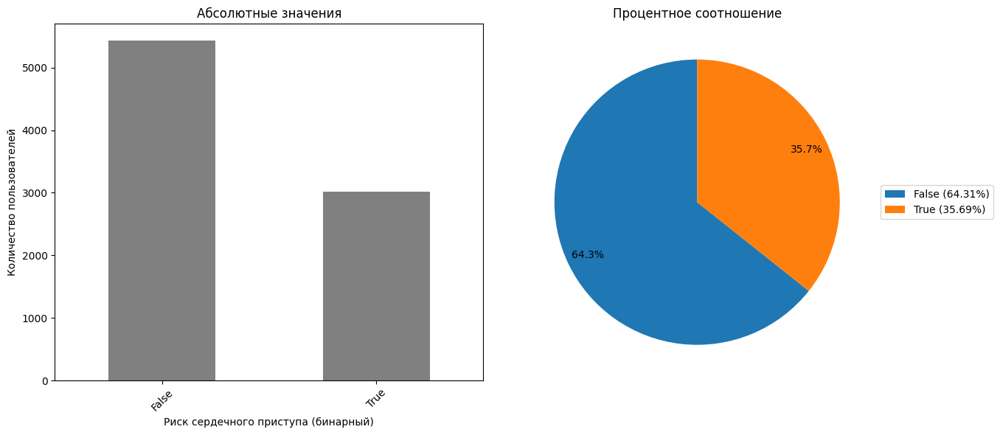

In [83]:
analyze_and_plot(heart_train_ru_v1, 'Риск сердечного приступа (бинарный)')

- **35% есть риск сердечных заболеваний, 65% нет риска сердечных заболеваний**

## 3.2 Исследовательский анализ тестовой выборки

Статистика для столбца 'Возраст':
count    935.000000
mean       0.452106
std        0.233873
min        0.044944
25%        0.235955
50%        0.460674
75%        0.651685
max        0.853933
Name: Возраст, dtype: float64




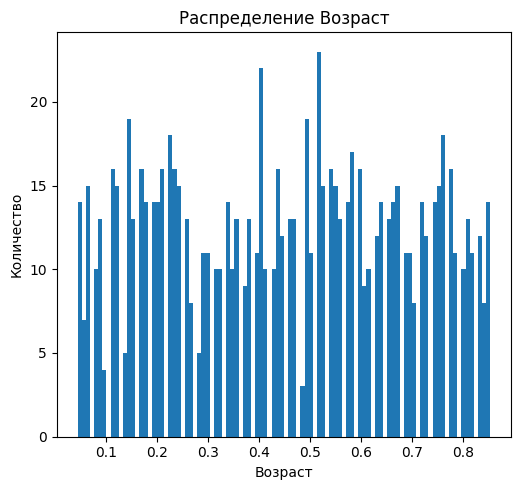

In [84]:
plot_hist_boxplot_float(heart_test_ru, 'Возраст')

- по признаку `возвраст` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных

Статистика для столбца 'Холестерин':
count    935.000000
mean       0.487796
std        0.286674
min        0.000000
25%        0.235714
50%        0.485714
75%        0.723214
max        0.996429
Name: Холестерин, dtype: float64




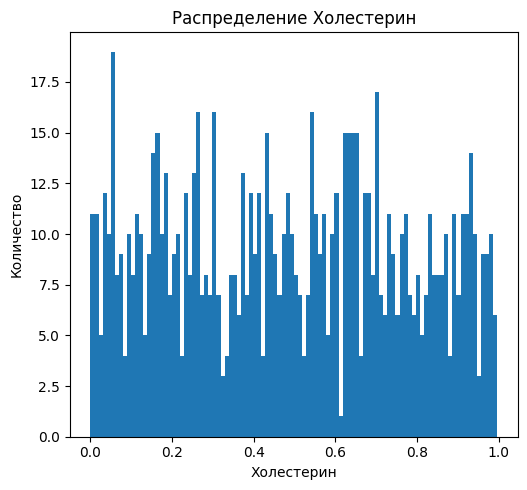

In [85]:
plot_hist_boxplot_float(heart_test_ru, 'Холестерин')

- по признаку `холестерин` имеется, значение 0, как и в тренирвочной выборке, холестерин не может быть 0.
- произведем замену на среднее значение из **тренировочной выборке**
- назовем новый датасет тестовой выборки - heart_test_ru_v1

In [86]:
# создадим глубокое копирование из исходной тестовой выборки
heart_test_ru_v1 = copy.deepcopy(heart_test_ru)

In [87]:
# Заменяем нули на среднее
heart_test_ru_v1['Холестерин'] = heart_test_ru_v1['Холестерин'].apply(lambda x: mean_value_h if x == 0 else x)
# проверка
heart_test_ru_v1['Холестерин'].min()

0.0035714285714285

Статистика для столбца 'Часы упражнений в неделю':
count    935.000000
mean       0.490327
std        0.289584
min        0.000336
25%        0.235647
50%        0.493305
75%        0.739898
max        0.998938
Name: Часы упражнений в неделю, dtype: float64




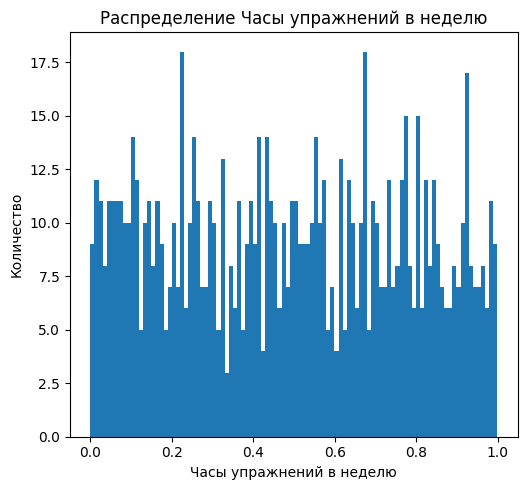

In [88]:
plot_hist_boxplot_float(heart_test_ru, 'Часы упражнений в неделю')

- по признаку `Часы упражнений в неделю` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных

Статистика для столбца 'Часы сидячего образа жизни в день':
count    935.000000
mean       0.506941
std        0.292561
min        0.001187
25%        0.247833
50%        0.518151
75%        0.767566
max        0.999033
Name: Часы сидячего образа жизни в день, dtype: float64




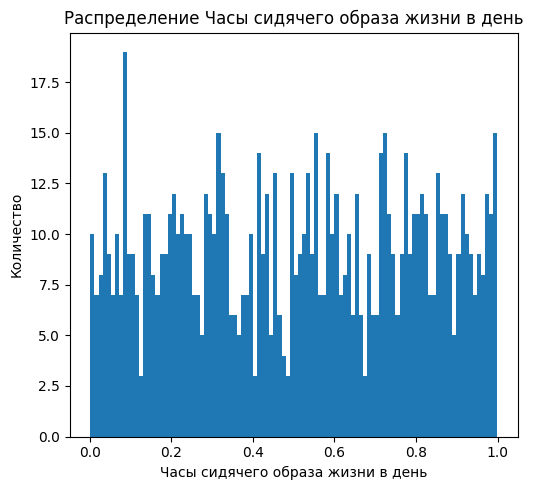

In [89]:
plot_hist_boxplot_float(heart_test_ru, 'Часы сидячего образа жизни в день')

- по признаку `Часы сидячего образа жизни в день` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных

Статистика для столбца 'Доход':
count    935.000000
mean       0.484060
std        0.278380
min        0.003351
25%        0.256395
50%        0.482586
75%        0.721821
max        0.998885
Name: Доход, dtype: float64




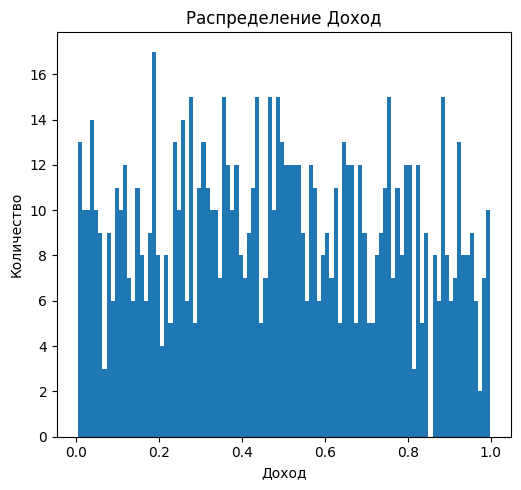

In [90]:
plot_hist_boxplot_float(heart_test_ru, 'Доход')

- по признаку `Доход` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных

Статистика для столбца 'ИМТ':
count    935.000000
mean       0.476200
std        0.296775
min        0.002598
25%        0.211395
50%        0.456156
75%        0.734170
max        0.999496
Name: ИМТ, dtype: float64




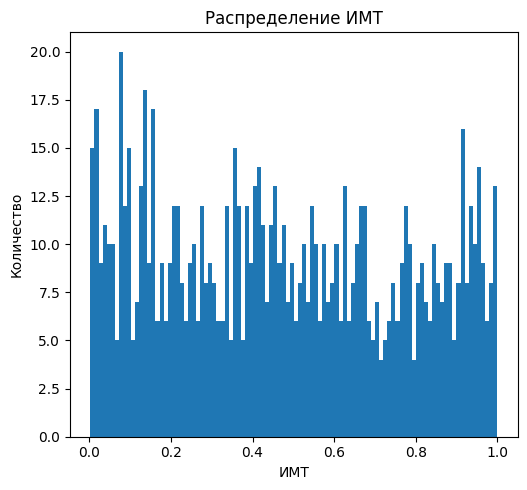

In [91]:
plot_hist_boxplot_float(heart_test_ru, 'ИМТ')

- по признаку `ИМТ` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных

Статистика для столбца 'Триглицериды':
count    935.000000
mean       0.486127
std        0.289200
min        0.000000
25%        0.243506
50%        0.471429
75%        0.732468
max        0.998701
Name: Триглицериды, dtype: float64




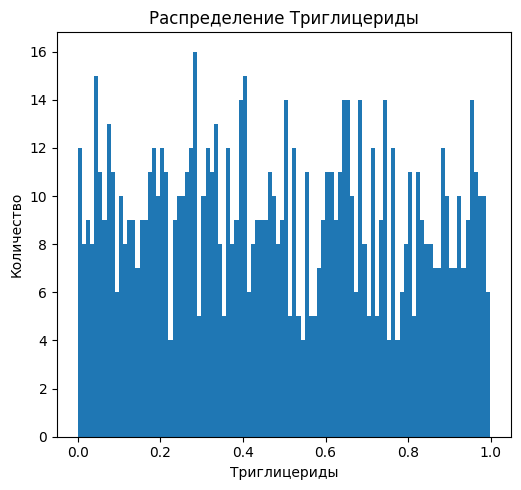

In [92]:
plot_hist_boxplot_float(heart_test_ru, 'Триглицериды')

- по признаку `Триглицериды` имеется, значение 0, как и в тренирвочной выборке, Триглицериды не могут быть 0.
- произведем замену на среднее значение из **тренировочной выборке**

In [93]:
# Заменяем нули на среднее
heart_test_ru_v1['Триглицериды'] = heart_test_ru_v1['Триглицериды'].apply(lambda x: mean_value_tr if x == 0 else x)
# проверка
heart_test_ru_v1['Триглицериды'].min()

0.0012987012987012

Статистика для столбца 'Часы сна в день':
count    935.000000
mean       0.512834
std        0.327594
min        0.000000
25%        0.166667
50%        0.500000
75%        0.833333
max        1.000000
Name: Часы сна в день, dtype: float64




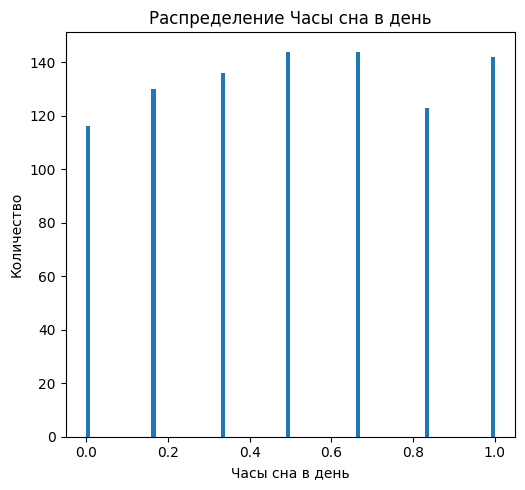

In [94]:
plot_hist_boxplot_float(heart_test_ru, 'Часы сна в день')

- по признаку `Часы сна в день` имеется, значение 0, как и в тренирвочной выборке, Часы сна в день не могут быть 0.
- произведем замену на среднее значение из **тренировочной выборке**

In [95]:
# Заменяем нули на среднее
heart_test_ru_v1['Часы сна в день'] = heart_test_ru_v1['Часы сна в день'].apply(lambda x: mean_value_hou if x == 0 else x)
# проверка
heart_test_ru_v1['Часы сна в день'].min()

0.1666666666666666

Статистика для столбца 'Сахар в крови':
count    935.000000
mean       0.225876
std        0.063750
min        0.029644
25%        0.227018
50%        0.227018
75%        0.227018
max        0.750988
Name: Сахар в крови, dtype: float64




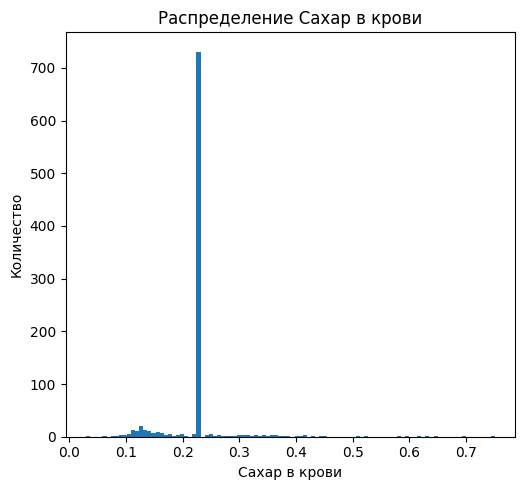

In [96]:
plot_hist_boxplot_float(heart_test_ru, 'Сахар в крови')

- по признаку `Сахар в крови` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных. (В тренировочных данных были 0)

Статистика для столбца 'CK-MB (показатель поврежд. миокарда)':
count    935.000000
mean       0.049011
std        0.074523
min        0.000000
25%        0.048229
50%        0.048229
75%        0.048229
max        1.000000
Name: CK-MB (показатель поврежд. миокарда), dtype: float64




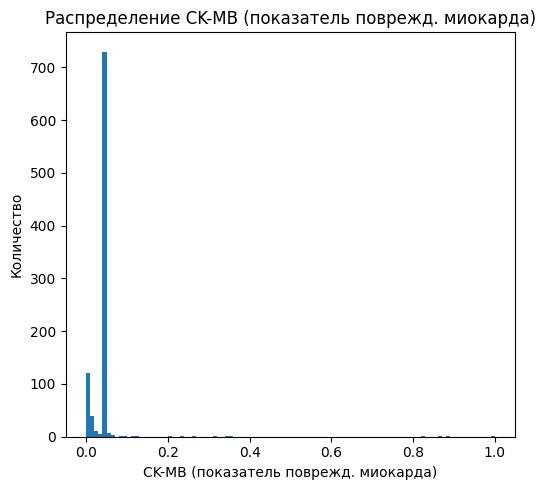

In [97]:
plot_hist_boxplot_float(heart_test_ru, 'CK-MB (показатель поврежд. миокарда)')

- по признаку `CK-MB (показатель поврежд. миокарда)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс

Статистика для столбца 'Тропонин (поврежден. серд. мышцы)':
count    935.000000
mean       0.034728
std        0.044943
min        0.000194
25%        0.036512
50%        0.036512
75%        0.036512
max        0.970871
Name: Тропонин (поврежден. серд. мышцы), dtype: float64




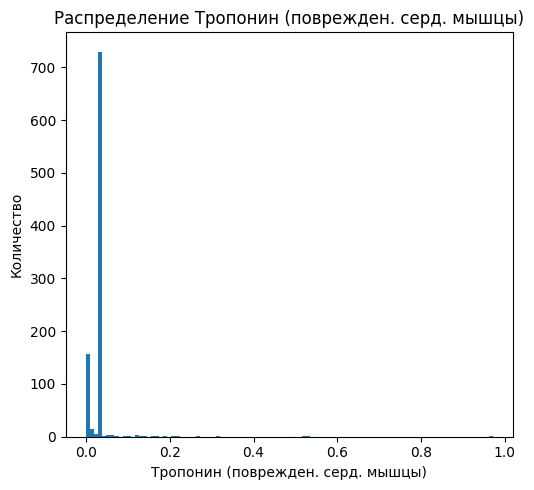

In [98]:
plot_hist_boxplot_float(heart_test_ru, 'Тропонин (поврежден. серд. мышцы)')

- по признаку `Тропонин (поврежден. серд. мышцы)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс

Статистика для столбца 'Систолическое артериальное давление':
count    935.000000
mean       0.449722
std        0.171918
min        0.161290
25%        0.296774
50%        0.458065
75%        0.600000
max        0.741935
Name: Систолическое артериальное давление, dtype: float64




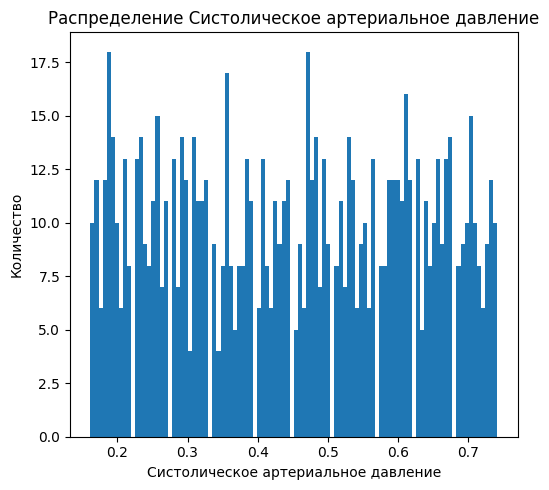

In [99]:
plot_hist_boxplot_float(heart_test_ru, 'Систолическое артериальное давление')

- по признаку `Систолическое артериальное давление` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных. 

Статистика для столбца 'Диастолическое артериальное давление':
count    935.000000
mean       0.500759
std        0.173262
min        0.209302
25%        0.348837
50%        0.500000
75%        0.651163
max        0.790698
Name: Диастолическое артериальное давление, dtype: float64




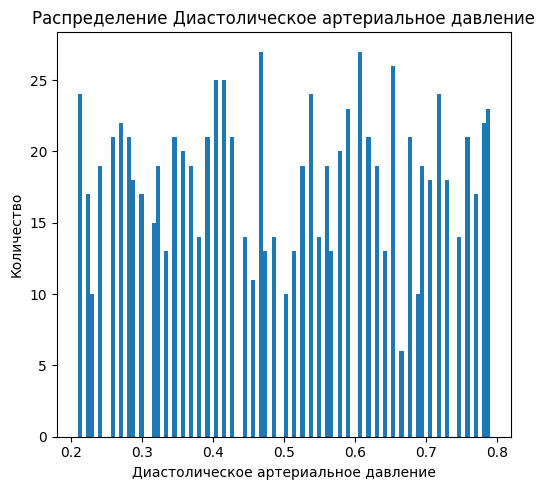

In [100]:
plot_hist_boxplot_float(heart_test_ru, 'Диастолическое артериальное давление')

- по признаку `Диастолическое артериальное давление` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных. 

# Корреляционный анализ тренировочной выборки

In [101]:
# выведем названия признаков
heart_train_ru_v1.columns

Index(['порядковый номер', 'Возраст', 'Холестерин',
       'Частота сердечных сокращений', 'Диабет', 'Семейный анамнез', 'Курение',
       'Ожирение', 'Употребление алкоголя', 'Часы упражнений в неделю',
       'Диета', 'Предыдущие проблемы с сердцем', 'Прием лекарств',
       'Уровень стресса', 'Часы сидячего образа жизни в день', 'Доход', 'ИМТ',
       'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день',
       'Риск сердечного приступа (бинарный)', 'Сахар в крови',
       'CK-MB (показатель поврежд. миокарда)',
       'Тропонин (поврежден. серд. мышцы)', 'Пол',
       'Систолическое артериальное давление',
       'Диастолическое артериальное давление', 'id'],
      dtype='object')

In [102]:
#Уберем признак порядковый номер, а id сделаем индексом, чтобы такой датасет проверить на корреляции
heart_train_ru_v1_for_corr = copy.deepcopy(heart_train_ru_v1)
heart_train_ru_v1_for_corr = heart_train_ru_v1_for_corr.drop(columns='порядковый номер')
heart_train_ru_v1_for_corr = heart_train_ru_v1_for_corr.set_index('id')
# проверка
heart_train_ru_v1_for_corr.columns

Index(['Возраст', 'Холестерин', 'Частота сердечных сокращений', 'Диабет',
       'Семейный анамнез', 'Курение', 'Ожирение', 'Употребление алкоголя',
       'Часы упражнений в неделю', 'Диета', 'Предыдущие проблемы с сердцем',
       'Прием лекарств', 'Уровень стресса',
       'Часы сидячего образа жизни в день', 'Доход', 'ИМТ', 'Триглицериды',
       'Дни физической активности в неделю', 'Часы сна в день',
       'Риск сердечного приступа (бинарный)', 'Сахар в крови',
       'CK-MB (показатель поврежд. миокарда)',
       'Тропонин (поврежден. серд. мышцы)', 'Пол',
       'Систолическое артериальное давление',
       'Диастолическое артериальное давление'],
      dtype='object')

In [103]:
# сделаем 3 переменные непрерывные, дискретные (булевые) и категориальные
continuous_cols = [] 
discrete_cols = [] 
categorical_cols = [] 

for i in heart_train_ru_v1_for_corr.columns:
    if heart_train_ru_v1_for_corr[i].dtype == 'category':
        categorical_cols.append(i)
    elif heart_train_ru_v1_for_corr[i].dtype == 'float64':
        continuous_cols.append(i)
    else:
        discrete_cols.append(i)
        

In [104]:
#проверка
print(categorical_cols)

print(continuous_cols)

print(discrete_cols)

['Диета', 'Уровень стресса']
['Возраст', 'Холестерин', 'Частота сердечных сокращений', 'Часы упражнений в неделю', 'Часы сидячего образа жизни в день', 'Доход', 'ИМТ', 'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день', 'Сахар в крови', 'CK-MB (показатель поврежд. миокарда)', 'Тропонин (поврежден. серд. мышцы)', 'Систолическое артериальное давление', 'Диастолическое артериальное давление']
['Диабет', 'Семейный анамнез', 'Курение', 'Ожирение', 'Употребление алкоголя', 'Предыдущие проблемы с сердцем', 'Прием лекарств', 'Риск сердечного приступа (бинарный)', 'Пол']


## Вычислим коэффициенты корреляции phi для датафрейма (для бинарных и категориальных признаков)

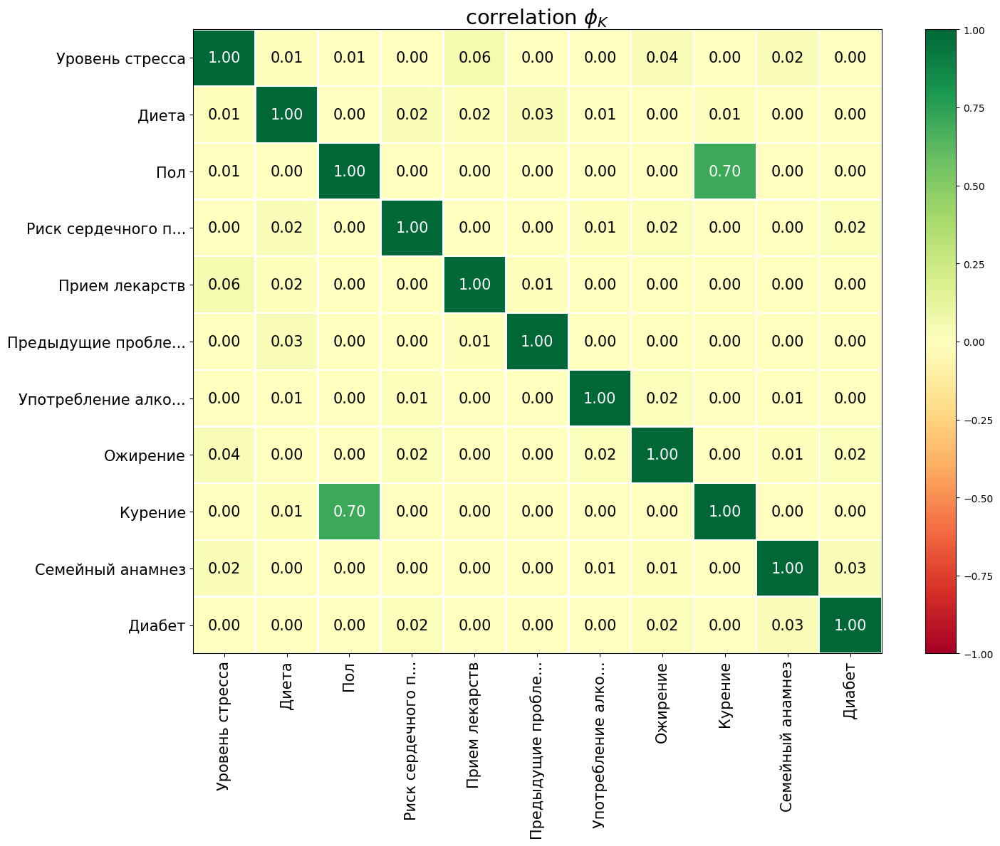

In [105]:
# вычисление коэффициентов корреляции phi для датафрейма
disc_plus_cat = discrete_cols + categorical_cols
phik_overview = heart_train_ru_v1_for_corr[disc_plus_cat].phik_matrix()

# визуализация тепловой карты коэффициентов корреляции
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    title=r"correlation $\phi_K$",
    fontsize_factor=1.5,
    figsize=(15, 12)
)

- **отмечается мультиколленеарность у признаков курение-пол**
- **это важные признаки, удалить мы их точно не можем, поэтому оставим так, если надо будет попробуем скорректировать регулиризацией**

## Вычислим коэффициенты корреляции Пирсона для датафрейма (для непрерывных признаков)

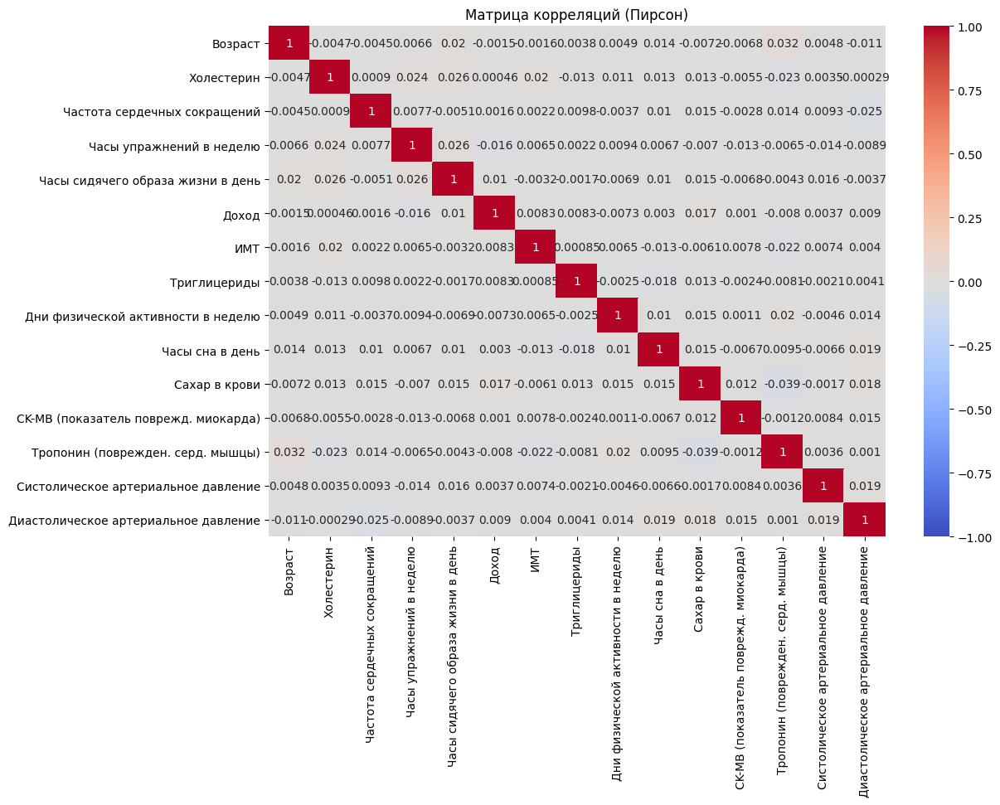

In [106]:
# Строим матрицу корреляций
corr_matrix = heart_train_ru_v1_for_corr[continuous_cols].corr(method='pearson')

# Визуализация
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Матрица корреляций (Пирсон)")
plt.show()

- **По корреляции Пирсона все признаки не связаны между собой, линейная связь отсуствует**

## Вычислим коэффициенты корреляции Спирмана для датафрейма (для непрерывных признаков и целевого признака, чтобы оценить утечку данных)

In [107]:
for col in heart_train_ru_v1_for_corr[continuous_cols]:
    # Вычисляем коэффициент Спирмена и p-value за один вызов
    k_sp, p_val = spearmanr(heart_train_ru_v1_for_corr[col], heart_train_ru_v1_for_corr['Риск сердечного приступа (бинарный)'])
    
    print(f"\nПеременная: {col}")
    print(f"Коэффициент Спирмена: {k_sp:.3f}, p-value: {p_val:.4f}")
    
    # Проверка на обратную зависимость (отрицательные значения)
    if k_sp < 0:
        if -0.2 < k_sp < 0:
            print("Обратная монотонная зависимость: очень слабая или отсутствует")
        elif -0.4 < k_sp <= -0.2:
            print("Обратная монотонная зависимость: слабая")
        elif -0.6 < k_sp <= -0.4:
            print("Обратная монотонная зависимость: умеренная")
        elif -0.8 < k_sp <= -0.6:
            print("Обратная монотонная зависимость: сильная")
        elif -1 <= k_sp <= -0.8:
            print("Обратная монотонная зависимость: очень сильная")
    
    # Проверка на прямую зависимость (положительные значения)
    elif k_sp > 0:
        if 0 <= k_sp < 0.2:
            print("Прямая монотонная зависимость: очень слабая или отсутствует")
        elif 0.2 <= k_sp < 0.4:
            print("Прямая монотонная зависимость: слабая")
        elif 0.4 <= k_sp < 0.6:
            print("Прямая монотонная зависимость: умеренная")
        elif 0.6 <= k_sp < 0.8:
            print("Прямая монотонная зависимость: сильная")
        elif 0.8 <= k_sp <= 1:
            print("Прямая монотонная зависимость: очень сильная")
    
    else:  # k_sp == 0
        print("Нет монотонной зависимости")
    
    # Проверка значимости p-value
    if p_val >= 0.05:
        print(f"p-value = {p_val:.4f} → связь незначима, возможно, случайная")
    else:
        print(f"p-value = {p_val:.4f} → корреляция статистически значима")


Переменная: Возраст
Коэффициент Спирмена: 0.008, p-value: 0.4722
Прямая монотонная зависимость: очень слабая или отсутствует
p-value = 0.4722 → связь незначима, возможно, случайная

Переменная: Холестерин
Коэффициент Спирмена: 0.018, p-value: 0.0894
Прямая монотонная зависимость: очень слабая или отсутствует
p-value = 0.0894 → связь незначима, возможно, случайная

Переменная: Частота сердечных сокращений
Коэффициент Спирмена: -0.002, p-value: 0.8780
Обратная монотонная зависимость: очень слабая или отсутствует
p-value = 0.8780 → связь незначима, возможно, случайная

Переменная: Часы упражнений в неделю
Коэффициент Спирмена: 0.009, p-value: 0.3837
Прямая монотонная зависимость: очень слабая или отсутствует
p-value = 0.3837 → связь незначима, возможно, случайная

Переменная: Часы сидячего образа жизни в день
Коэффициент Спирмена: 0.002, p-value: 0.8700
Прямая монотонная зависимость: очень слабая или отсутствует
p-value = 0.8700 → связь незначима, возможно, случайная

Переменная: Доход
К

- **Все признаки относительно целевого признака имееют слабую зависимость по коэф. Спирмана**
- **связь незначима, возможно, случайная**

## Визуализируем связь непрерывных признаков по целевому признаку (для непрерывных признаков и целевого признака)

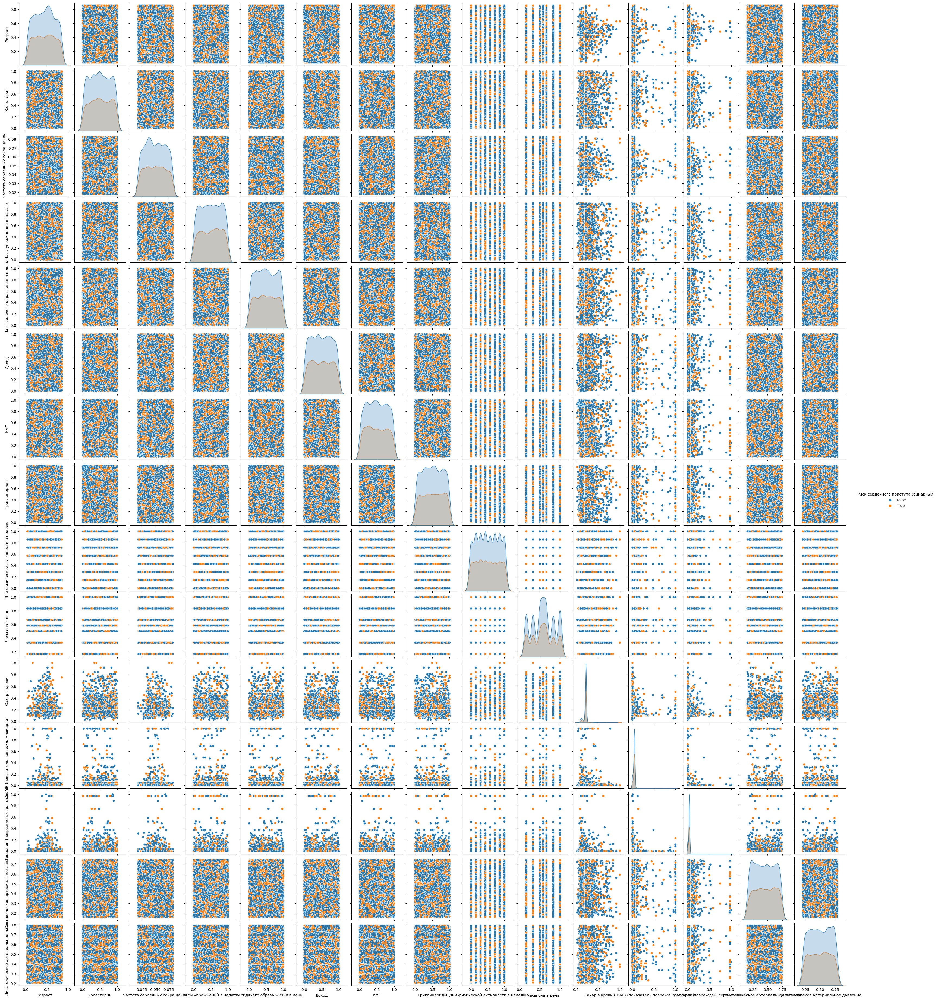

In [108]:
cont_plus_goalfeature = continuous_cols + ['Риск сердечного приступа (бинарный)']

#матрица диаграмм рассеяния по дф  
sns.pairplot(
    data=heart_train_ru_v1_for_corr[cont_plus_goalfeature], 
    aspect=.85,
    hue='Риск сердечного приступа (бинарный)');

- **визуально непрерывные признаки совсем не кореллируют между собой (с отражением по 1,0 целевого признака)**

# Выводы по исследовательскому анализу данных
*Тренировочная выборка* <br>
*Исследовательский анализ численных признаков*
1. по признаку `возвраст` распределение равномерное, выбросов нет, мин макс логичны
2. по признаку `холестерин` распределение равномерное, выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель холестрина не может быть 0. **Таких данных 0,36%**
3. по признаку `Частота сердечных сокращений` распределение равномерное, выбросов нет, мин макс логичны
4. по признаку `Частота упражнений в неделю` распределение равномерное, выбросов нет, мин макс логичны
5. по признаку `Часы сидячего образа жизни в день` распределение равномерное, выбросов нет, мин макс логичны
6. по признаку `Доход` распределение равномерное, выбросов нет, мин макс логичны, есть значение 0, что может интерпретироваться как отсуствие дохода
7. по признаку `ИМТ` выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель ИМТ не может быть 0. **Таких данных 0,0118%**
8. по признаку `Триглицериды` выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель Триглицериды не может быть 0. **Таких данных 0,17%**
9. по признаку `Часы сна в день` выбросов нет, макс логичен, мин - кажется подозрительным, значение 0, показатель Часы сна в день не может быть 0. **Таких данных 13.6%**
10. по признаку `Сахар в крови` наблюдается аномальное количество со значением примерно 0,22, макс логичен, мин - кажется подозрительным, значение 0, показатель Сахар в крови не может быть 0. **Таких данных 13.6%** Стоить отметить, что ровно такой же процент у признака `Часы сна в день`**. 78% данных имеют значение Сахара в крови 0,22-0,23, возможно это норма, а остальные значения это отклонения, оставим данные как есть
11. по признаку `CK-MB (показатель поврежд. миокарда)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс
12. по признаку `Тропонин (поврежден. серд. мышцы)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс
13. по признаку `Систолическое артериальное давление` выбросов нет, мин макс логичен, отсуствует значение 0
14. по признаку `Диастолическое артериальное давление` выбросов нет, мин макс логичен, отсуствует значение 0
**Произведем замену нулевых значений на среднее значение по данным** <br>
***По признакам `холестерин` `ИМТ` `Триглицериды` это менее процента данных*** <br>
***По признаку `Часы сна в день` это допустимо предположить что люди спят в среднем среднее число часов по выборке в присутствии значения 0*** <br>
***По признаку `Сахар в крови` это допустимо предположить что у людей при значении 0 будет среднее значение по выборке, ранее мы отмечали что 78% данных имеют значение 0,22-0,23*** <br>
**После преобразований это будет датасет с названием heart_train_ru_v1** <br>

*Исследовательский анализ булевых и категориальных признаков*
1. 65% имеют диабет, 35% диабета не имееют
2. 49% имеют семейный анамнез, 51% семейного анамнеза не имееют
3. 91% курят, 9% не курят
4. 50% имеют ожирение, 50% ожирения не имееют
5. 60%употребляют алкоголь, 40% алкоголь не употребляют
6. примерно по 33 % имеют диету категорий 0 1 2, диету категории 3 нет таких пользователей
7. 50% имеют проблемы с сердцем, 50% не имеют проблем с сердцем
8. 50% принимают лекарства, 50% не принимают лекарства
9. поровну представленны группы по уровню стресса, примерно по 10 % на каждую категорию от 1 до 10
10. 70% мужщины, 30% женщины
11. 35% есть риск сердечных заболеваний, 65% нет риска сердечных заболеваний <br>
    
*Тестовая выборка* <br>
*Исследовательский анализ численных признаков*
**Для тестовой выборки необходимо провести только исследовательский анализ численных признаков, чтобы исключить аномалии, не реалистичные данные, заменить их примемами из тренировочной выборки**<br>
**Анализ категориальных признаков для тестовой не требуется, чтобы тестирование было в слепую**<br>
1. - по признаку `возвраст` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных
2. - по признаку `холестерин` имеется значение 0, как и в тренирвочной выборке, холестерин не может быть 0. Произвили замену на среднее значение из **тренировочной выборке**. Назвали новый датасет тестовой выборки - heart_test_ru_v1
3. по признаку `Часы упражнений в неделю` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных
4. по признаку `Часы сидячего образа жизни в день` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных
5. по признаку `Доход` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных
6. по признаку `ИМТ` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных
7. по признаку `Триглицериды` имеется, значение 0, как и в тренирвочной выборке, Триглицериды не могут быть 0. Произведем замену на среднее значение из **тренировочной выборке**
8. по признаку `Часы сна в день` имеется, значение 0, как и в тренирвочной выборке, Часы сна в день не могут быть 0. Произведем замену на среднее значение из **тренировочной выборке**
9. по признаку `Сахар в крови` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных. (В тренировочных данных были 0)
10. по признаку `CK-MB (показатель поврежд. миокарда)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс
11. по признаку `Тропонин (поврежден. серд. мышцы)` такое какое получилось, ввиду того что это узкопрофильный показатель, примем его таким какой он есть с таким распределением, значениями мин и макс
12. по признаку `Систолическое артериальное давление` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных.
13. по признаку `Диастолическое артериальное давление` распределение равномерное, выбросов нет, мин макс логичны, нет 0, нет высокого значений, даже в отнормированных данных.

*Корреляционный анализ* <br>
1. **отмечается мультиколленеарность у признаков курение-пол. это важные признаки, удалить мы их точно не можем, поэтому оставим так, если надо будет попробуем скорректировать регулиризацией**
2. **По корреляции Пирсона все признаки не связаны между собой, линейная связь отсуствует**
3. **По корреляции Пирсона все признаки не связаны между собой, линейная связь отсуствует**
4. **Все признаки относительно целевого признака имееют слабую зависимость по коэф. Спирмана. Связь незначима, возможно, случайная**
5. **визуально непрерывные признаки совсем не кореллируют между собой (с отражением по 1,0 целевого признака)**<br>

*Тестовая выборка* <br>
*Корреляционный анализ* <br>
1. Корреляционный анализ не требуется


# 4. Задача 1: Разработать и обучить модель МО

## 4.1 Подготовим данные к МО

In [109]:
heart_train_ru_v1.columns

Index(['порядковый номер', 'Возраст', 'Холестерин',
       'Частота сердечных сокращений', 'Диабет', 'Семейный анамнез', 'Курение',
       'Ожирение', 'Употребление алкоголя', 'Часы упражнений в неделю',
       'Диета', 'Предыдущие проблемы с сердцем', 'Прием лекарств',
       'Уровень стресса', 'Часы сидячего образа жизни в день', 'Доход', 'ИМТ',
       'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день',
       'Риск сердечного приступа (бинарный)', 'Сахар в крови',
       'CK-MB (показатель поврежд. миокарда)',
       'Тропонин (поврежден. серд. мышцы)', 'Пол',
       'Систолическое артериальное давление',
       'Диастолическое артериальное давление', 'id'],
      dtype='object')

-**Поработав с обучением модели, установлено, чтобы добиться приемлемого результата по метрикам необходимо скорректировать выборку, поэтому предлагается удалить признак 'Доход', как признак не влияющий на РЗС, по субъективному предположению, и признак 'Пол', чтобы исключить мультиколленеарность, наша задача обучить модель, чтобы она могла предсказывать РСЗ, вне зависимости от пола, поэтому считаем допустимо удалить признак 'Пол'**

In [110]:
heart_train_ru_v1 = heart_train_ru_v1.drop(columns='Доход')
heart_train_ru_v1 = heart_train_ru_v1.drop(columns='Пол')

heart_test_ru_v1 = heart_test_ru_v1.drop(columns='Доход')
heart_test_ru_v1 = heart_test_ru_v1.drop(columns='Пол')

In [111]:
# подготовка данных, отделение целевого признака:
X = heart_train_ru_v1.drop(['id', 'порядковый номер', 'Риск сердечного приступа (бинарный)'], axis=1)
Y = heart_train_ru_v1['Риск сердечного приступа (бинарный)']

# создание константы 
RANDOM_STATE = 42
TEST_SIZE = 0.25

# разделим данные на тренировочные и валидационную, зафиксируем random_state
X_train, X_test, y_train, y_test = train_test_split(
    X,
    Y,
    random_state=RANDOM_STATE,
    test_size=TEST_SIZE
)

In [112]:
print(categorical_cols)

continuous_cols.remove('Доход')
print(continuous_cols)

discrete_cols.remove('Риск сердечного приступа (бинарный)')
discrete_cols.remove('Пол')
print(discrete_cols)

['Диета', 'Уровень стресса']
['Возраст', 'Холестерин', 'Частота сердечных сокращений', 'Часы упражнений в неделю', 'Часы сидячего образа жизни в день', 'ИМТ', 'Триглицериды', 'Дни физической активности в неделю', 'Часы сна в день', 'Сахар в крови', 'CK-MB (показатель поврежд. миокарда)', 'Тропонин (поврежден. серд. мышцы)', 'Систолическое артериальное давление', 'Диастолическое артериальное давление']
['Диабет', 'Семейный анамнез', 'Курение', 'Ожирение', 'Употребление алкоголя', 'Предыдущие проблемы с сердцем', 'Прием лекарств']


In [113]:
#Формируем списки столбцов для обработки:
ord_col = categorical_cols
num_col = continuous_cols
bool_col = discrete_cols

In [114]:
# Собираем кусок пайплайна для обработки данных:
df_preprocessor = ColumnTransformer(
    [('bool', 'passthrough', bool_col),
     ('ord', 'passthrough', ord_col),
     ('num', 'passthrough', num_col)
    ], 
    remainder='passthrough'
)
# Итоговый пайплайн:
pipe_final = Pipeline([
    ('preprocessor', df_preprocessor),
    ('models', DecisionTreeClassifier())
])

## 4.2 Обучение модели

## Выбор и обоснование метрики

Ниже приведена матрица ошибок для целевого признака "Риск сердечных заболеваний (РСЗ)"

![Риск сердечных заболеваний](conflux_matrix.jpg)

Согласно матрице выше, критичным аспектом является FN, больного определить здоровым. Также FP (здорового определить больным) в рассматриваемой задаче является ошибкой прогноза по определению, поэтому предлагается выбрать F1 меру метрику. Модель МО не должна принимать решения в условиях определения риска сердечных заболеваний, она должна лишь подсказывать лечащему врачу. И в случае ошибок 1-го 2-го рода врач может принять решение не следовать прогнозу модели, такая модель может служить помощником, но не отвественным инструментом за диагноз.
- **Выбираем F2 меру метрику, которая учитывает метрики precision и recall одновременно, которой мы можем регулировать важность метрики precision и recall.**

### ИСПОЛЬЗОВАНИЕ BETA=2 - с акцентом на recall

In [115]:
f1_scorer = make_scorer(fbeta_score, beta=2, pos_label=True, zero_division=0)

In [116]:
param_grid = [
    # Словарь для DecisionTreeClassifier():
    {
        'models': [DecisionTreeClassifier(random_state=42)],
        'models__max_depth': [3, 5, 7, None],
        'models__class_weight': ['balanced', {False: 1, True: 2}],
        'models__min_samples_split': [2, 5, 10],
        'models__max_features': ['sqrt', None]
    },

    # Градиентный бустинг (XGBoost):
    {
        'models': [XGBClassifier(random_state=42, eval_metric='logloss')],
        'models__n_estimators': [50, 100],
        'models__learning_rate': [0.01, 0.05],
        'models__max_depth': [3, 5],
        'models__scale_pos_weight': [1, 3, 5],
        'models__gamma': [0, 0.1]
    },

    # Словарь для SVC():
    {
        'models': [SVC(random_state=42, class_weight='balanced')],
        'models__kernel': ['rbf'],
        'models__C': [0.1, 1],
        'models__gamma': ['scale', 0.01],
        'models__probability': [True]  # Для совместимости с predict_proba
    }
]

# подбор
randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    scoring=f1_scorer,  
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    n_iter=15,  
    random_state=42,
    n_jobs=-1,
    verbose=1,
    error_score='raise' 
)

randomized_search.fit(X_train, y_train)

final_model = randomized_search.best_estimator_.named_steps['models']

# вероятности предсказаний
y_train_proba = final_model.predict_proba(X_train)[:, 1]  # Вероятности класса `True`

print('Лучшая модель:\n\n', final_model)
print('Параметры модели:\n\n', final_model.get_params())
print('')
print('Метрика f2 мера (beta=1) для лучшей модели на тренировочных данных:', randomized_search.best_score_)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Лучшая модель:

 XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)
Параметры модели:

 {'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'cols

- **f1 мера (beta=2) составила 0.732,отразим матрицу ошибок**

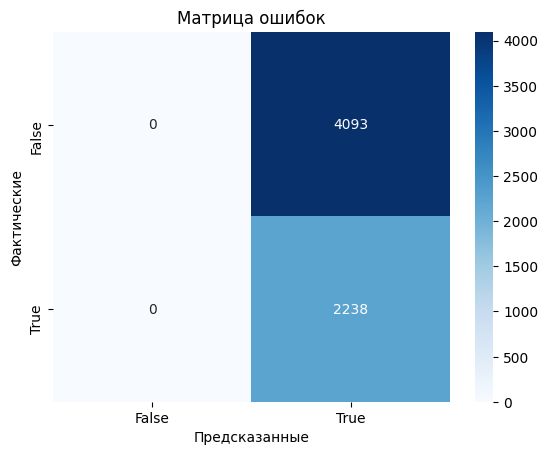

In [117]:
#Предсказания на тренировочных данных
y_train_pred = randomized_search.best_estimator_.predict(X_train)
cm = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['False', 'True'], 
            yticklabels=['False', 'True'])
plt.xlabel('Предсказанные')
plt.ylabel('Фактические')
plt.title('Матрица ошибок')
plt.show()

In [118]:
# выведем метрики
metrics_dict = {
    'accuracy': accuracy_score(y_train, y_train_pred),
    'precision': precision_score(y_train, y_train_pred),
    'recall': recall_score(y_train, y_train_pred),
    'f1': f1_score(y_train, y_train_pred)
}

print("\nMetrics Dictionary:")
print(metrics_dict)


Metrics Dictionary:
{'accuracy': 0.3534986574000948, 'precision': 0.3534986574000948, 'recall': 1.0, 'f1': 0.5223479985996032}


получили: <br>
- низкий accuracy, низкий precision, показывает что модель совсем не справляется с точностью предсказаний
- высокий recall, практически отсуствие False предсказаний, то есть на любой случай матрица предсказывает True. То есть в случае FN (рис. выше) - 0 случаев) т.е. когда по факту есть РСЗ, модель покажет, что РСЗ отсуствует, потому что она старается предсказать только True 1
- так как модель подбиралась в автоматическом режиме, что говорит о том что это лучшие метрики, которые можно получить 
- **Такие показатели метрик свидетельствует о дисбалансе классов**

- Чтобы его устранить подберем порог классификации
- (по умолчанию порог классификации у моделей 0,5)

In [119]:
thresholds = np.linspace(0, 1, 100)  # Перебираем пороги от 0 до 1
f1_scores = []

for thresh in thresholds:
    y_train_pred = (y_train_proba >= thresh)
    f1 = f1_score(y_train, y_train_pred)
    f1_scores.append(f1)

# Оптимальный порог
optimal_threshold = thresholds[np.argmax(f1_scores)]
print(f"Оптимальный порог: {optimal_threshold:.3f}")


Оптимальный порог: 0.586


Отразим на диаграмме зависимость f1 меры от порога классификации

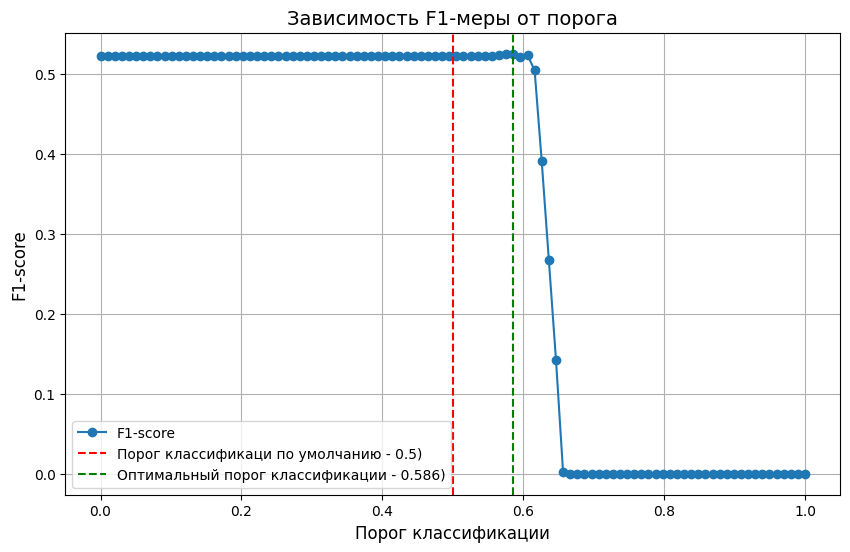

In [120]:
plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores, marker='o', label='F1-score')
plt.axvline(0.5, color='red', linestyle='--', label='Порог классификаци по умолчанию - 0.5)')
plt.axvline(0.586, color='green', linestyle='--', label='Оптимальный порог классификации - 0.586)')
plt.xlabel('Порог классификации', fontsize=12)
plt.ylabel('F1-score', fontsize=12)
plt.title('Зависимость F1-меры от порога', fontsize=14)
plt.grid(True)
plt.legend()
plt.show()

Используя порог классификация, перестроим матрицу и пересчитаем метрики: 

In [121]:
y_train_pred_opt = (y_train_proba >= optimal_threshold)

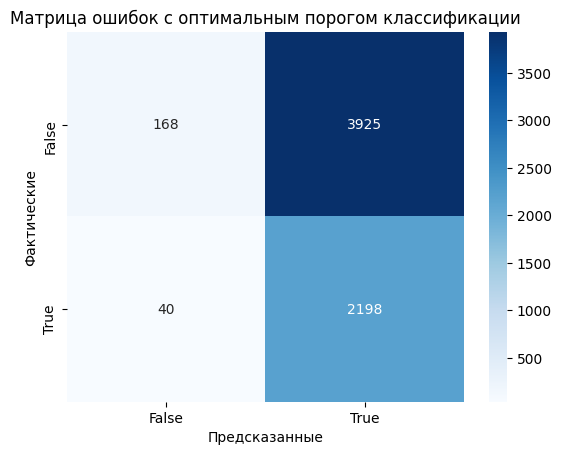

In [122]:
#матрица ошибок с оптимальным порогом классификации
cm = confusion_matrix(y_train, y_train_pred_opt)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['False', 'True'], 
            yticklabels=['False', 'True'])
plt.xlabel('Предсказанные')
plt.ylabel('Фактические')
plt.title('Матрица ошибок с оптимальным порогом классификации')
plt.show()

In [123]:
# выведем метрики после оптимального порога классификации
metrics_dict = {
    'accuracy': accuracy_score(y_train, y_train_pred_opt),
    'precision': precision_score(y_train, y_train_pred_opt),
    'recall': recall_score(y_train, y_train_pred_opt),
    'f1': f1_score(y_train, y_train_pred_opt)
}

print("\nMetrics Dictionary:")
print(metrics_dict)


Metrics Dictionary:
{'accuracy': 0.3737166324435318, 'precision': 0.358974358974359, 'recall': 0.9821268990169795, 'f1': 0.5257744288960651}


- После подбора оптимального порога классификации, метрики немного улучшились
- **Также по наличию значений FN>0, 40 и FP (168) свидетельствует о том что модель ошибается, конректно в нашем случае это хороший результат относительно ранее полученного, значит модель не всегда ставит True**
- Согласно, метрикам и матрице ошибок, такую модель с таким порогом классификации можно считать оптимальной.

## Провека на валидационной выборке. На лучшей модели с оптимальным порогом классификации

In [124]:
#берем лучшую модель
best_model = randomized_search.best_estimator_
#Предсказания на валидационных данных
y_test_pred = best_model.predict(X_test)
y_test_proba = best_model.predict_proba(X_test)[:, 1]  # Вероятности класса True
#использование ранее подборанного порогав классификации
y_test_pred_optimized = (y_test_proba >= optimal_threshold)

f2_test = fbeta_score(y_test, y_test_pred_optimized, beta=1, pos_label=True)
print(f"f2 мера на валидационных данных: {f2_test:.4f}")

f2 мера на валидационных данных: 0.5329


- f2 мера метрика на валидационных данных 0.5329

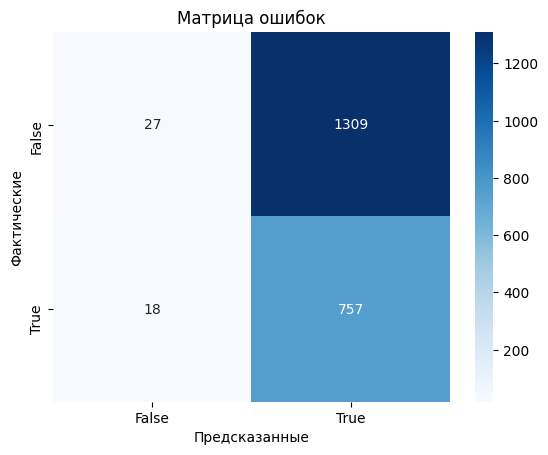

In [125]:
#построим матрицу ошибок на валидационных данных
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_test_pred_optimized)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['False', 'True'], 
            yticklabels=['False', 'True'])
plt.xlabel('Предсказанные')
plt.ylabel('Фактические')
plt.title('Матрица ошибок')
plt.show()

In [126]:
# выведем метрики после оптимального порога классификации
metrics_dict = {
    'accuracy': accuracy_score(y_test, y_test_pred_optimized),
    'precision': precision_score(y_test, y_test_pred_optimized),
    'recall': recall_score(y_test, y_test_pred_optimized),
    'f1': f1_score(y_test, y_test_pred_optimized)
}

print("\nMetrics Dictionary:")
print(metrics_dict)


Metrics Dictionary:
{'accuracy': 0.37138796778777833, 'precision': 0.3664085188770571, 'recall': 0.9767741935483871, 'f1': 0.5329109468497009}


- **Метрика на валидационных данных показала сопоставимый результат с тренировочными данными, ПРИ ОПТИМАЛЬНОМ ПОРОГЕ КЛАССИФИКАЦИИ**
- на валидационных выборке PRECISION = 37%, т.е. в 37% случаев модель смогла определить РСЗ (точность определений). 63% случаев ошибка первого рода, ложные срабатывания. 
- на твалидационных выборке RECALL = 36%, т.е. в 36% случаев модель смогла определить РСЗ (полнота точных определений). 64% случаев ошибка второго рода,  определены моделью здоров, когда был по факту больной.
**С одной стороны абсолютные значения метрики стоило бы увеличить, чтобы увелисить точноность прогноза, с другой стороны была проделана работа по увеличению точности прогноза - подбор порога классификации и валидационный прогоз подтвердил роботоспособность модели**


## Выводы по обучению модели

**Перед обучением модели удалили признаки 'Доход' в предположении что этот признак не может влиять на РСЗ и 'Пол', чтобы устранить мультиколленеарность **

*Работа с тренирочными данными* <br>
1. Выбирали F2 меру метрику, которая учитывает метрики precision и recall одновременно, которой мы можем регулировать важность метрики precision и recall
2. f2 на тренировочных данных составила 0.73 (при BETA=2, акцент на RECALL), однако  матрица ошибок показала, что 'погоня' за recall привела к тому, что recall= 1, все предсказание True, отсуствие False предсказаний, то есть на любой случай матрица предсказывает True.**Такая модель МО не подходит**
3. низкий accuracy - 0,35, низкий precision - 0,35, f1 - 0.522 показывает что модель совсем не справляется с точностью предсказаний
4. так как модель подбиралась в автоматическом режиме, что говорит о том что это лучшие метрики, которые можно получить
5. **Такие показатели метрик свидетельствует о дисбалансе классов** Чтобы его устранить подберем порог классификации (по умолчанию порог классификации у моделей 0,5)<br>
4. После подбора оптимального порога классификации, метрики немного улучшились (accuracy - 0,37, precision - 0,35, f1 - 0.525)
- **Также по наличию значений FN>0, 40 и FP 168 (по матрице ошибок) свидетельствует о том что модель ошибается, конректно в нашем случае это хороший результат относительно ранее полученного (FN = 0 и FP =0 ), значит модель не всегда ставит True**
- Согласно, метрикам и матрице ошибок, такую модель с таким порогом классификации можно считать оптимальной. 
*Работа с валидационными данными* <br> 
1. f2 мера (BETA=1) метрика на валидационных данных 0,532 близка к тренировочным данным 0,525, то есть модель подтверждает свою прогнозную силу <br>
2. на валидационной выборке PRECISION = 37%, т.е. в 37% случаев модель смогла определить РСЗ (точность определений). 63% случаев ошибка первого рода, ложные срабатывания.
3. на валидационной выборке RECALL = 36%, т.е. в 36% случаев модель смогла определить РСЗ (полнота точных определений). 64% случаев ошибка второго рода,  определены моделью здоров, когда был по факту больной.
4. **С одной стороны абсолютные значения метрики стоило бы увеличить, чтобы увеличить точнность прогноза, с другой стороны была проделана работа по увеличению точности прогноза: удаление признаков 'Доход' 'Пол' подбор порога классификации и валидационный прогоз подтвердил роботоспособность модели**

**Рекомендации по дальнейшему улучшению метрик:**
**Удалив признаки `Доход` `Пол` позволило получить оптимальный порог классификации, который увеличил метрики (без удаления признаков, даже порог классификаци не подбирался, 0.5 по умолчанию был оптимальный, при этом метрики были крайне негативны по смыслу, False результатов не было совсем)**
**Поэтому, чтобы улучшить метрики необходимо удалять признаки по одному или списком, даже если кажется что такой признак очень важен, чтобы определить, без каких признаков модель станет показывать лучший результат, прогноз, метрики**<br>
(Что я имеем ввиду, что может удалить признак курение - сильно бы улучшило прогнозную силу модели, метрики, хотя кажется, что курение прямо вляиет на РСЗ и удалять его нельзя)

# 5. Задача 2: разработать интерфейс, приложение на FastAPI к модели МО для предсказания на тестовой выборке

1. в корневой папке создадим файл `mainapi.py`, в котором разработаем приложение на FastAPI к модели МО полученной выше для предсказания на тестовой выборке
2. приложение принимает на вход путь к csv файлу тестовой выборки, `heart_test.csv` (со всеми признаками без правильных ответов), выполняет предсказание: обрабатывает признаки тестовой выборки, использует модель МО, подбирает порог классификации полученные выше и возвращает ответ в формате JSON 2 столбца: “id” и “prediction” <br>
*Дополнительно:* <br>
- проведем предсказания на тестовых данных (`heart_test.csv`) и выгрузим csv файл со столбцами “id” и “prediction”, назовем `prediction.csv` 📃 таким образом мы сможем сравнить работает ли наше приложение, идентичен ли csv файл `prediction.csv` со столбцами “id” и “prediction”  и JSON с “id” и “prediction” полученный в ходе работы приложения
- нам понадобится лучшая модель выбранная в ходе проекта выше, также мы использовали порог классификаци, сохраним эту информацию чтобы использовать ее в приложении, сохраним в папку model, `best_model_with_optimal_threshold.joblib`💾

In [127]:
# Подготовка признаков (как при обучении)
X_test = heart_test_ru_v1.drop(['id', 'порядковый номер'], axis=1) 
# Получаем предсказания
y_test_proba = best_model.predict_proba(X_test)[:, 1]  
y_test_pred = (y_test_proba >= optimal_threshold).astype(int)  

# Сохраняем результаты в CSV
results = pd.DataFrame({
    'id': heart_test_ru_v1['id'],  
    'prediction': y_test_pred,  
})

#Экспорт в CSV
results.to_csv("test_predictions.csv", index=False)
print("📃Предсказания сохранены в test_predictions.csv✅")

📃Предсказания сохранены в test_predictions.csv✅


In [128]:
#сохраняем модель c порогом классификации
model_data = {
    "model": final_model,
    "threshold": optimal_threshold
}
# полный путь к папке models
MODELS_DIR = Path("C:/Users/msmk8/REPO/predicting_cardiovascular_disease_risk/model")

# Сохраняем модель в файл
joblib.dump(model_data, MODELS_DIR / 'best_model.joblib')

print(f"💾Модель и порог классификации сохранены в папку: model✅")

💾Модель и порог классификации сохранены в папку: model✅
